### Rainfall Weather Forecasting
### Project Description
#### Weather forecasting is the application of science and technology to predict the conditions of the atmosphere for a given location and time. Weather forecasts are made by collecting quantitative data about the current state of the atmosphere at a given place and using meteorology to project how the atmosphere will change.
#### Rain Dataset is to predict whether or not it will rain tomorrow. The Dataset contains about 10 years of daily weather observations of different locations in Australia. Here, predict two things:
 
##### 1. Problem Statement: 
##### a) Design a predictive model with the use of machine learning algorithms to forecast whether or not it will rain tomorrow.
##### b)  Design a predictive model with the use of machine learning algorithms to predict how much rainfall could be there.


##### Dataset Description:
##### Number of columns: 23


###### Date  - The date of observation
###### Location  -The common name of the location of the weather station
###### MinTemp  -The minimum temperature in degrees celsius
###### MaxTemp -The maximum temperature in degrees celsius
###### Rainfall  -The amount of rainfall recorded for the day in mm
###### Evaporation  -The so-called Class A pan evaporation (mm) in the 24 hours to 9am
###### Sunshine  -The number of hours of bright sunshine in the day.
###### WindGustDi r- The direction of the strongest wind gust in the 24 hours to midnight
###### WindGustSpeed -The speed (km/h) of the strongest wind gust in the 24 hours to midnight
###### WindDir9am -Direction of the wind at 9am
###### WindDir3pm -Direction of the wind at 3pm
###### WindSpeed9am -Wind speed (km/hr) averaged over 10 minutes prior to 9am
###### WindSpeed3pm -Wind speed (km/hr) averaged over 10 minutes prior to 3pm
###### Humidity9am -Humidity (percent) at 9am
###### Humidity3pm -Humidity (percent) at 3pm
###### Pressure9am -Atmospheric pressure (hpa) reduced to mean sea level at 9am
###### Pressure3pm -Atmospheric pressure (hpa) reduced to mean sea level at 3pm
###### Cloud9am - Fraction of sky obscured by cloud at 9am. 
###### Cloud3pm -Fraction of sky obscured by cloud 
###### Temp9am-Temperature (degrees C) at 9am
###### Temp3pm -Temperature (degrees C) at 3pm
###### RainToday -Boolean: 1 if precipitation (mm) in the 24 hours to 9am exceeds 1mm, otherwise 0
###### RainTomorrow -The amount of next day rain in mm. Used to create response variable . A kind of measure of the "risk".

Dataset Link-  
•	https://raw.githubusercontent.com/dsrscientist/dataset3/main/weatherAUS.csv
•	https://github.com/dsrscientist/dataset3


## Importing require library for performing EDA, Data Wrangling and data cleaning


In [1]:
import pandas as pd # for data wrangling purpose
import numpy as np # Basic computation library
import seaborn as sns # For Visualization 
import matplotlib.pyplot as plt # ploting package
%matplotlib inline
import warnings # Filtering warnings
warnings.filterwarnings('ignore')

In [2]:
# Importing Temperature Forecast dataset Csv file using pandas


In [3]:
df=pd.read_csv('C:\\Users\\user\\Downloads\\weatherAUS.csv')


In [4]:
print('No of Rows:',df.shape[0])
print('No of Columns:',df.shape[1])
pd.set_option('display.max_columns', None) # This will enable us to see truncated columns
df.head()

No of Rows: 8425
No of Columns: 23


,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [5]:
df.columns


Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

In [6]:
# Now lets identify which types of data types do they all belongs

df.dtypes

Date              object
Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
dtype: object


#### So we have 16 Numeric datatypes and 7 Object type data types and Rain Tommorrow is in object type which makes it Logistic Regression and Classification problem

# EDA

In [7]:
# To get the information about the dataset

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8350 non-null   float64
 3   MaxTemp        8365 non-null   float64
 4   Rainfall       8185 non-null   float64
 5   Evaporation    4913 non-null   float64
 6   Sunshine       4431 non-null   float64
 7   WindGustDir    7434 non-null   object 
 8   WindGustSpeed  7434 non-null   float64
 9   WindDir9am     7596 non-null   object 
 10  WindDir3pm     8117 non-null   object 
 11  WindSpeed9am   8349 non-null   float64
 12  WindSpeed3pm   8318 non-null   float64
 13  Humidity9am    8366 non-null   float64
 14  Humidity3pm    8323 non-null   float64
 15  Pressure9am    7116 non-null   float64
 16  Pressure3pm    7113 non-null   float64
 17  Cloud9am       6004 non-null   float64
 18  Cloud3pm

#### Here we get the Information regarding Column,Non-Null Count(columns having NaN Values) ,Dtypes and Memory usage of the dataset ..Here we notice one thing that Non Null columns counts are different which indicates that Null values are present in the dataset and needed to be rectified
## NOW LETS CHECK THE NULL VALUES

In [8]:
df.isnull().sum()


Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

#### Here we can see that lot of NaN values are present in the dataset which is needed to be filled accordingly

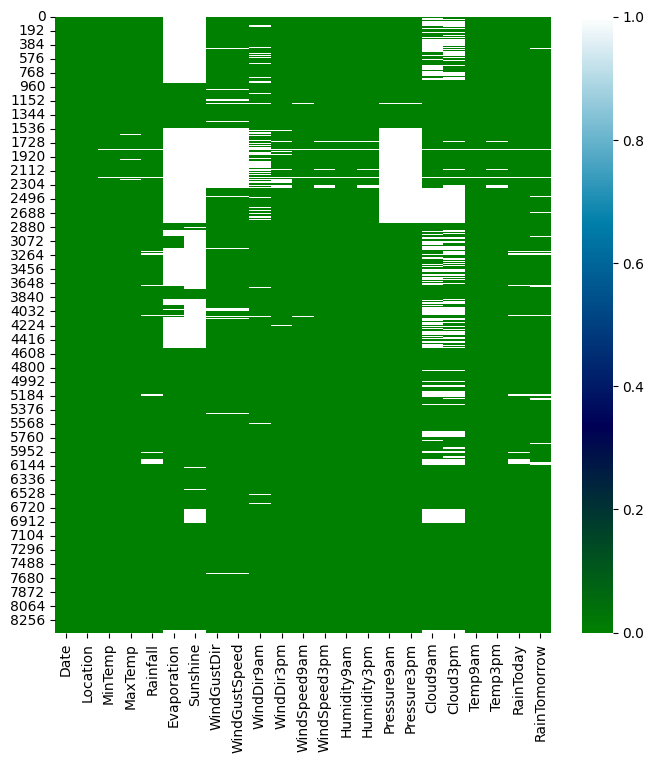

In [9]:
### Let's visualize NaN values in the dataset
plt.figure(figsize=(8,8))
sns.heatmap(df.isnull(),cmap="ocean")
plt.show()

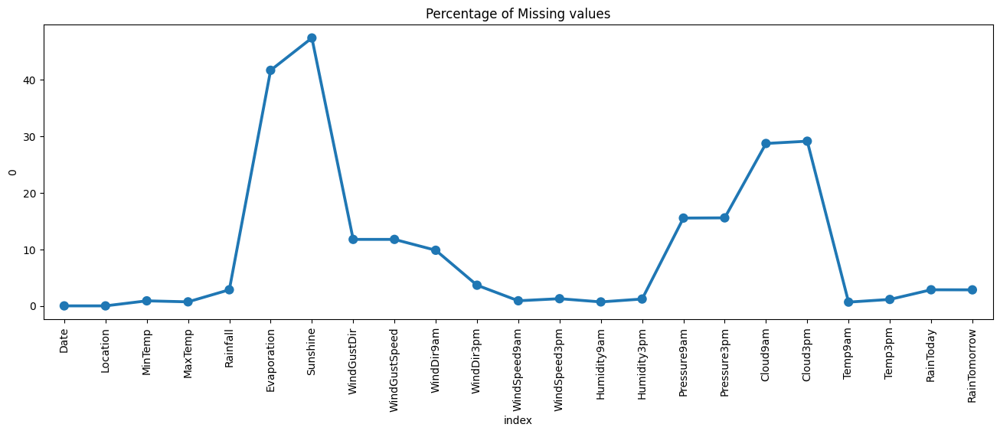

In [12]:
missing = pd.DataFrame((df.isnull().sum()) * 100 / df.shape[0]).reset_index()
plt.figure(figsize=(16, 5))
ax = sns.pointplot(x='index', y=0, data=missing)
plt.xticks(rotation=90, fontsize=10)
plt.title("Percentage of Missing values")
plt.show()

### We can see that NaN values are present in the dataset


In [13]:
df.head()


,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [14]:
# Filling NaN values in Numerical columns 

df["MinTemp"] = df["MinTemp"].fillna(df["MinTemp"].median())
df["MaxTemp"] = df["MaxTemp"].fillna(df["MaxTemp"].median())
df["Rainfall"] = df["Rainfall"].fillna(df["Rainfall"].median())
df["Evaporation"] = df["Evaporation"].fillna(df["Evaporation"].median())
df["Sunshine"] = df["Sunshine"].fillna(df["Sunshine"].median())
df["WindGustSpeed"] = df["WindGustSpeed"].fillna(df["WindGustSpeed"].mean())
df["WindSpeed9am"] = df["WindSpeed9am"].fillna(df["WindSpeed9am"].mean())
df["WindSpeed3pm"] = df["WindSpeed3pm"].fillna(df["WindSpeed3pm"].mean())
df["Humidity9am"] = df["Humidity9am"].fillna(df["Humidity9am"].mean())
df["Humidity3pm"] = df["Humidity3pm"].fillna(df["Humidity3pm"].mean())
df["Pressure9am"] = df["Pressure9am"].fillna(df["Pressure9am"].mean())
df["Pressure3pm"] = df["Pressure3pm"].fillna(df["Pressure3pm"].mean())
df["Cloud9am"] = df["Cloud9am"].fillna(df["Cloud9am"].mean())
df["Cloud3pm"] = df["Cloud3pm"].fillna(df["Cloud3pm"].mean())
df["Temp9am"] = df["Temp9am"].fillna(df["Temp9am"].mean())
df["Temp3pm"] = df["Temp3pm"].fillna(df["Temp3pm"].mean())

#-------------------------------------------------------------------------------------
# Filling NaN values in Catagorical columns 

df['WindGustDir'] = df['WindGustDir'].fillna(df['WindGustDir'].mode()[0])
df['WindDir9am'] = df['WindDir9am'].fillna(df['WindDir9am'].mode()[0])
df['WindDir3pm'] = df['WindDir3pm'].fillna(df['WindDir3pm'].mode()[0])
df['RainToday'] = df['RainToday'].fillna(df['RainToday'].mode()[0])
df['RainTomorrow']=df['RainTomorrow'].fillna(df['RainTomorrow'].mode()[0])

#------------------------------------------------------------------------------------

In [15]:
df.isnull().sum()


Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64

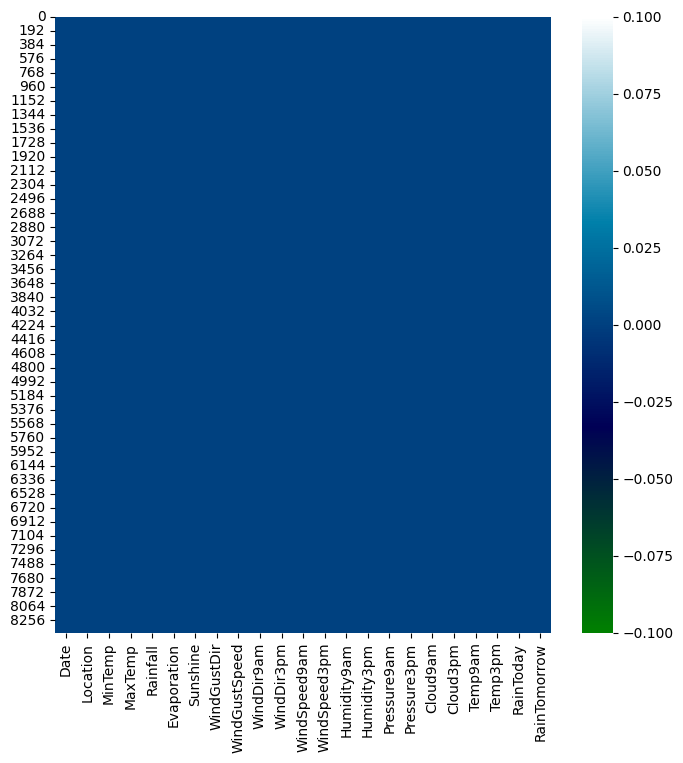

In [16]:
### Let's visualize NaN values in the dataset
plt.figure(figsize=(8,8))
sns.heatmap(df.isnull(),cmap="ocean")
plt.show()

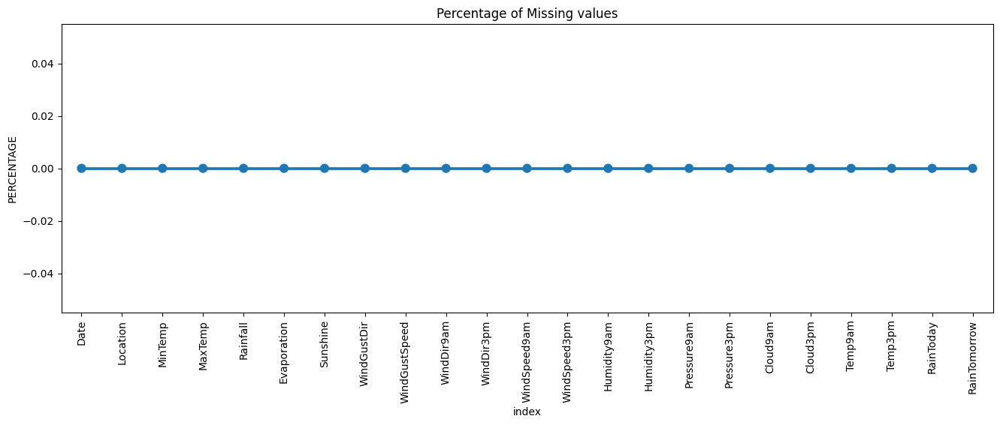

In [18]:
missing = pd.DataFrame((df.isnull().sum())*100/df.shape[0]).reset_index()
plt.figure(figsize=(16,5))
ax = sns.pointplot(x='index',y=0,data=missing)
plt.xticks(rotation =90,fontsize =10)
plt.title("Percentage of Missing values")
plt.ylabel("PERCENTAGE")
plt.show()

### Now All my Null Values have been Filled according to the data types


In [19]:
# Lets find the Unique values present in our dataset
df.nunique()


Date             3004
Location           12
MinTemp           285
MaxTemp           331
Rainfall          250
Evaporation       116
Sunshine          140
WindGustDir        16
WindGustSpeed      53
WindDir9am         16
WindDir3pm         16
WindSpeed9am       35
WindSpeed3pm       36
Humidity9am        91
Humidity3pm        95
Pressure9am       385
Pressure3pm       375
Cloud9am           10
Cloud3pm           10
Temp9am           305
Temp3pm           329
RainToday           2
RainTomorrow        2
dtype: int64

#### We can see that lot of Unique values are present in the dataset and inside Rain Tommorrow 2 variables are present as Yes and No
## Now Lets check the Duplicate Values

In [20]:
df.shape


(8425, 23)

In [21]:
# Check any duplicate data is present or not, If present then we will drop them.
df=df.drop_duplicates()

In [22]:
df.shape


(6762, 23)


### So Now we can see that my Duplicate Values have been Dropped as earlier Rows consist of 8425 data and Now 6762

In [24]:
# Now lets find the value counts of the  Columns
for i in df.columns:
        print(df[i].value_counts())
        print('*'*100)

Date
2011-02-11    4
2011-02-18    4
2011-03-18    4
2011-03-19    4
2011-03-20    4
             ..
2016-11-03    1
2016-11-02    1
2016-11-01    1
2016-10-31    1
2013-06-08    1
Name: count, Length: 3004, dtype: int64
****************************************************************************************************
Location
PerthAirport    1204
Albury           907
Newcastle        822
Melbourne        811
Williamtown      615
CoffsHarbour     611
Brisbane         579
Penrith          482
Darwin           250
Wollongong       237
Adelaide         205
Uluru             39
Name: count, dtype: int64
****************************************************************************************************
MinTemp
13.3    118
13.2     58
12.0     57
14.8     53
12.7     53
       ... 
26.6      1
28.0      1
26.9      1
1.4       1
26.0      1
Name: count, Length: 285, dtype: int64
****************************************************************************************************
MaxTemp
23

### OBSERVATION :-
#### RainTomorrow columns which is a taget variable is imbalanced .
#### Encoding Technique is to be used on many catagorical columns later.
### NaN Value is filled alrady.

In [25]:
df.head()


,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,4.6,8.7,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,4.6,8.7,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,4.6,8.7,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,4.6,8.7,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,4.6,8.7,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,No,No


### Correct data column in datetime format


In [26]:
#Now We will convert date from object type to date type and then seperate day, month and year
df['Date']=pd.to_datetime(df['Date'])
df["Day"] = df['Date'].dt.day
df["Month"] = df['Date'].dt.month
df["Year"] = df['Date'].dt.year

In [27]:
# Now Drop the date as we have already got Day,month and year
df.drop("Date",axis=1,inplace=True)

In [28]:
df.shape


(6762, 25)

In [29]:
df.head()


,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
0,Albury,13.4,22.9,0.6,4.6,8.7,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,No,No,1,12,2008
1,Albury,7.4,25.1,0.0,4.6,8.7,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,No,No,2,12,2008
2,Albury,12.9,25.7,0.0,4.6,8.7,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,No,No,3,12,2008
3,Albury,9.2,28.0,0.0,4.6,8.7,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,No,No,4,12,2008
4,Albury,17.5,32.3,1.0,4.6,8.7,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,No,No,5,12,2008


In [30]:
# Checking wheather the target vaiable contains any space
df.loc[df['RainTomorrow']==" "]


,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year


### So No Space is present in the dataset


## A. Univariate Analysis

In [31]:
df.columns


Index(['Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow', 'Day', 'Month', 'Year'],
      dtype='object')

### 1st we will plot all catagorical columns


Value_Counts :- Location
PerthAirport    1204
Albury           907
Newcastle        822
Melbourne        811
Williamtown      615
CoffsHarbour     611
Brisbane         579
Penrith          482
Darwin           250
Wollongong       237
Adelaide         205
Uluru             39
Name: count, dtype: int64


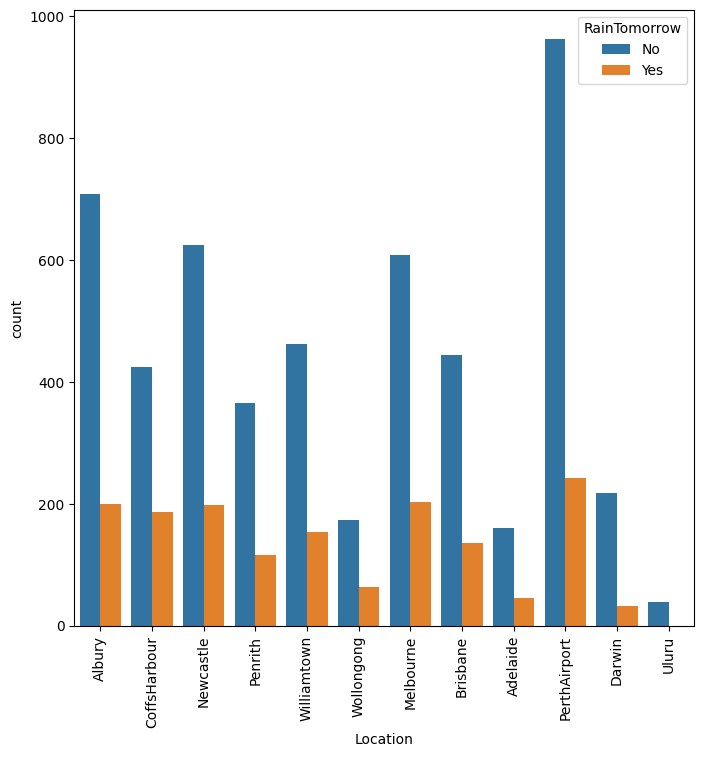

In [36]:
plt.figure(figsize=(8, 8))
print('Value_Counts :-', df['Location'].value_counts())
sns.countplot(x='Location', hue='RainTomorrow', data=df)
plt.xticks(rotation=90)
plt.show()


### We can see that the maximum count is of PerthAirport and Probability of maximum rainfall for tomorrow seems to be for the same . .Uluru has the least count and rainfall for tommorrow dont seem for this place

Value_Counts :- WindGustDir
N      1401
E       518
SW      465
W       434
WSW     420
WNW     398
SSE     390
S       376
SE      370
ENE     357
NE      300
SSW     299
NW      296
NNE     287
ESE     267
NNW     184
Name: count, dtype: int64


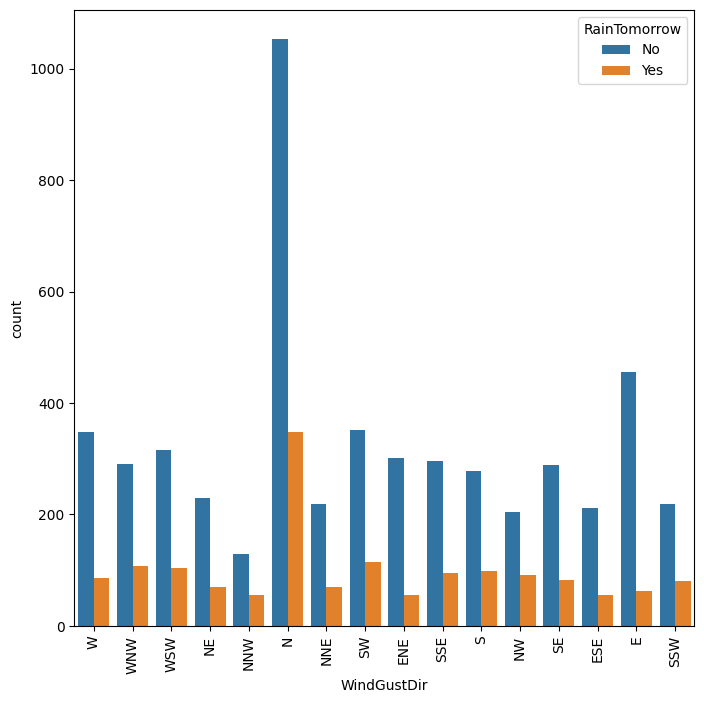

In [38]:
plt.figure(figsize=(8,8))
print ('Value_Counts :-',df['WindGustDir'].value_counts())
sns.countplot(x='WindGustDir',hue='RainTomorrow',data=df)
plt.xticks(rotation=90)
plt.show()

### We can see that the maximum count of 'N' direction and the probability to rain tomorrow is also from 'N' Direction and the least of both is from NNW.

Value_Counts :- WindDir9am
N      1403
SW      590
NW      463
SE      439
ENE     397
WSW     394
SSW     368
NE      364
E       338
NNE     337
S       324
WNW     301
SSE     300
W       299
ESE     229
NNW     216
Name: count, dtype: int64


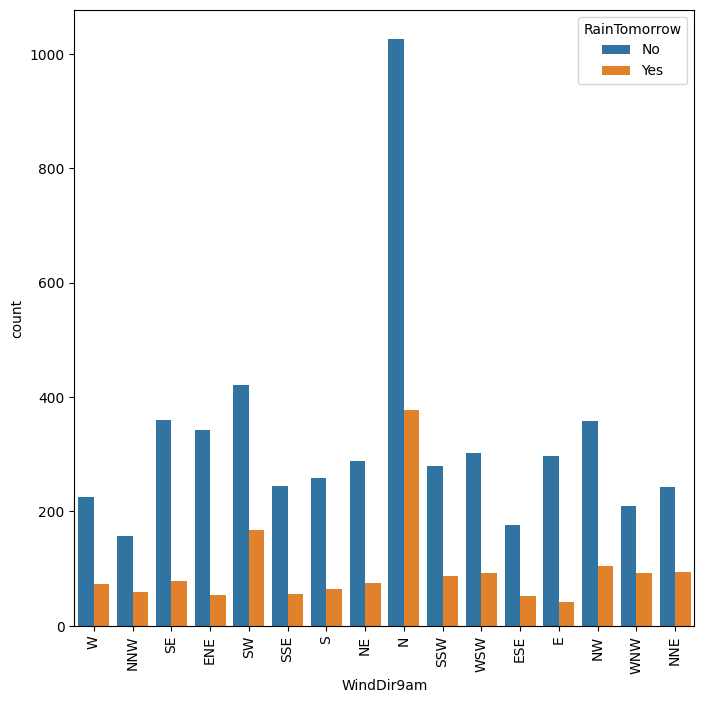

In [39]:
plt.figure(figsize=(8,8))
print ('Value_Counts :-',df['WindDir9am'].value_counts())
sns.countplot(x='WindDir9am',hue='RainTomorrow',data=df)
plt.xticks(rotation=90)
plt.show()

### We can see that the maximum count of 'N' direction and the probability to rain tomorrow is also from 'N' Direction and the least of both is from NNW.

Value_Counts :- WindDir3pm
SE     971
WSW    499
S      493
NE     480
SW     428
SSE    421
NW     400
W      399
E      392
WNW    389
ESE    363
N      354
ENE    348
NNE    305
SSW    277
NNW    243
Name: count, dtype: int64


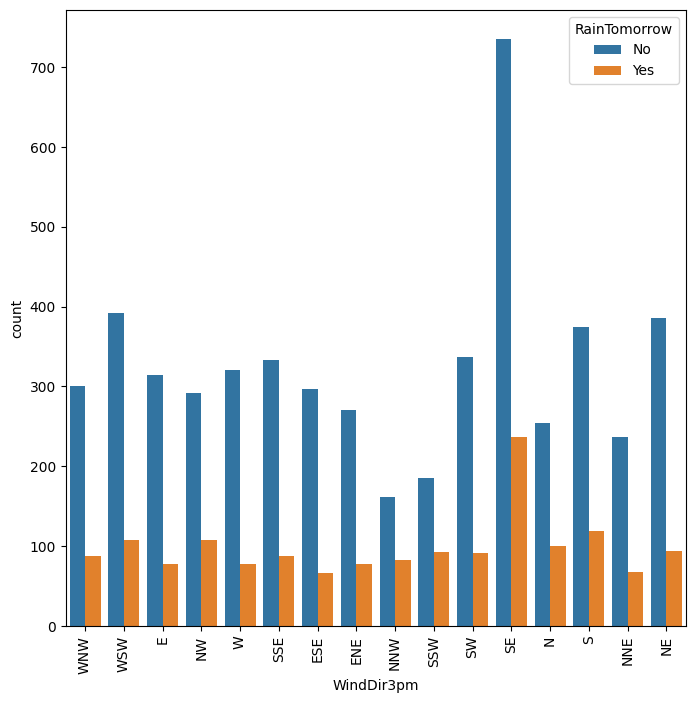

In [40]:
plt.figure(figsize=(8,8))
print ('Value_Counts :-',df['WindDir3pm'].value_counts())
sns.countplot(x='WindDir3pm',hue='RainTomorrow',data=df)
plt.xticks(rotation=90)
plt.show()

### We can see that the maximum count of 'SE' direction and the probability to rain tomorrow is also from 'SE' Direction and the least of both is from NNW.

Value_Counts :- RainToday
No     5190
Yes    1572
Name: count, dtype: int64


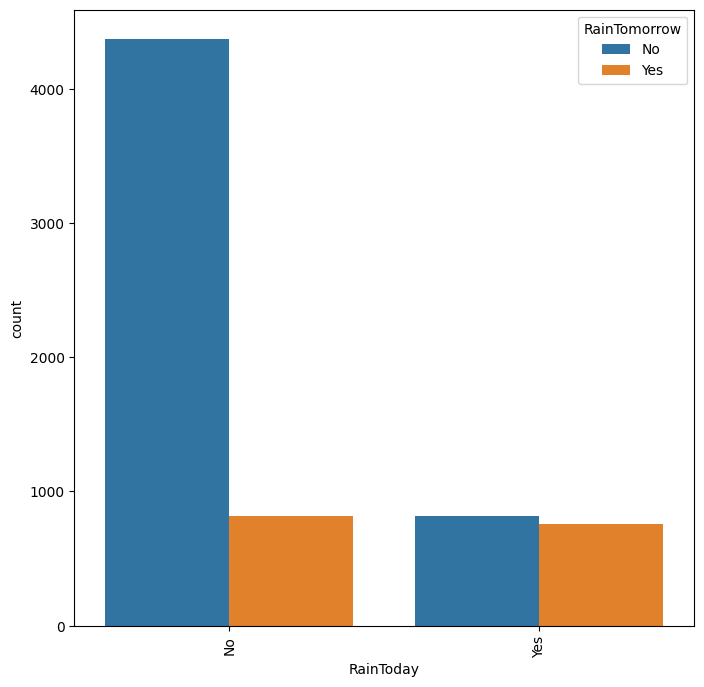

In [41]:
plt.figure(figsize=(8,8))
print ('Value_Counts :-',df['RainToday'].value_counts())
sns.countplot(x='RainToday',hue='RainTomorrow',data=df)
plt.xticks(rotation=90)
plt.show()

### When there is a chance of rain today ,so there can be equal chance of rain tomorrow atleast 90%

Value_Counts :- RainToday
No     5190
Yes    1572
Name: count, dtype: int64


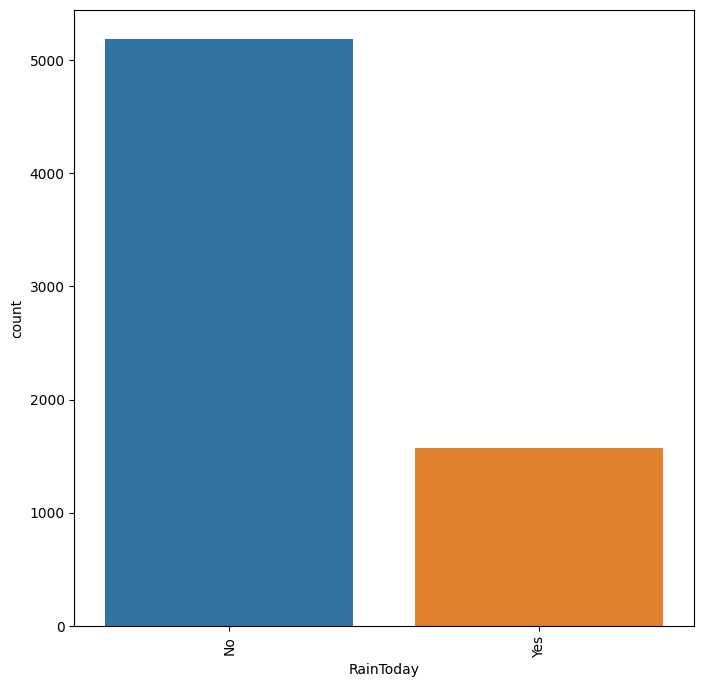

In [43]:
plt.figure(figsize=(8,8))
print ('Value_Counts :-',df['RainToday'].value_counts())
sns.countplot(x='RainToday',data=df)
plt.xticks(rotation=90)
plt.show()


### The max probability of rain is No as per the count
## Now we will plot Numerical columns

In [44]:
# checking for numerical columns
numerical_col=[]
for i in df.dtypes.index:
    if df.dtypes[i]!='object':
        numerical_col.append(i)
print("Numerical columns are:\n",numerical_col)

Numerical columns are:
 ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'Day', 'Month', 'Year']


#### These are the Numerical Columns ahead


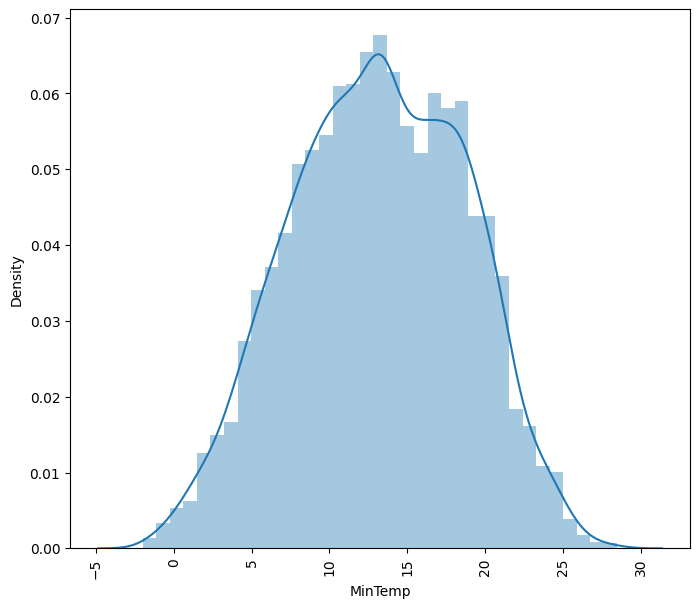

In [45]:
plt.figure(figsize=(8,7))
sns.distplot(df['MinTemp'])
plt.xticks(rotation=90)
plt.show()

In [46]:
df['MinTemp'].mean()


13.11112097012718

### As by the graph and by the mean command also ,we see that the average MinTemp is 13


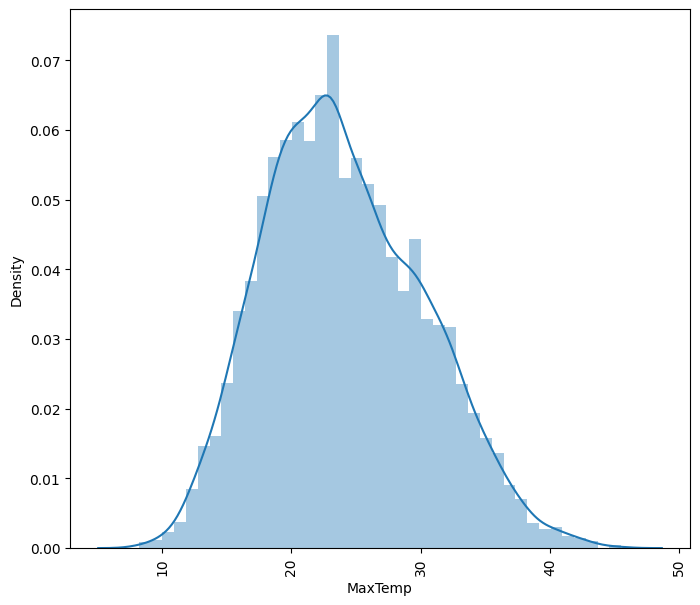

Mean :- 24.091614906832298


In [47]:
plt.figure(figsize=(8,7))
sns.distplot(df['MaxTemp'])
plt.xticks(rotation=90)
plt.show()
print ('Mean :-',df['MaxTemp'].mean())

### As by the graph and by the mean command also ,we see that the average MaxTemp is 24


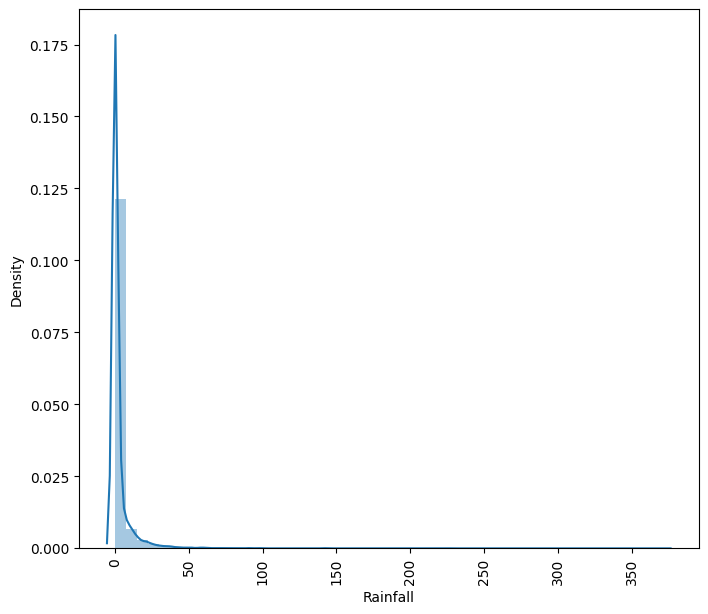

Mean :- 2.7234102336586803


In [48]:
plt.figure(figsize=(8,7))
sns.distplot(df['Rainfall'])
plt.xticks(rotation=90)
plt.show()
print ('Mean :-',df['Rainfall'].mean())

### We have the average rainfall recorded in a day 3mm


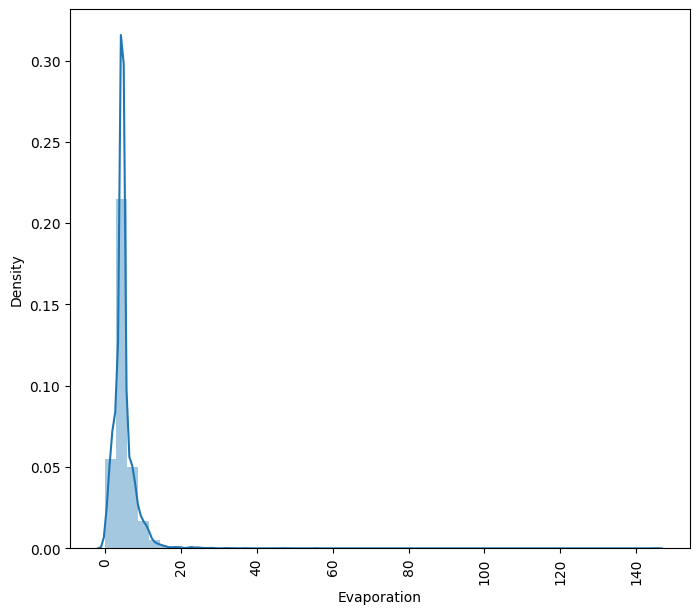

Mean :- 4.9989795918367355


In [49]:
plt.figure(figsize=(8,7))
sns.distplot(df['Evaporation'])
plt.xticks(rotation=90)
plt.show()
print ('Mean :-',df['Evaporation'].mean())

### evaporation (mm) in the 24 hours to 9am in average is 5mm


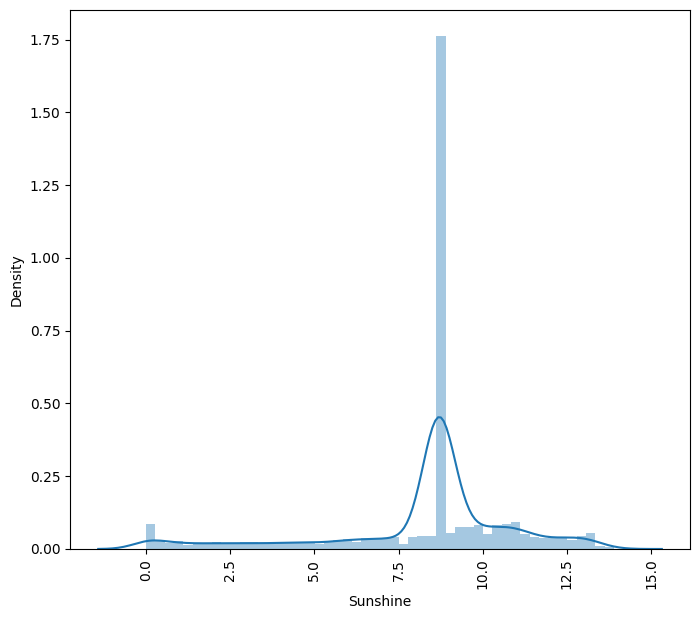

Mean :- 8.27809819580006


In [50]:
plt.figure(figsize=(8,7))
sns.distplot(df['Sunshine'])
plt.xticks(rotation=90)
plt.show()
print ('Mean :-',df['Sunshine'].mean())

### The average Sunshine is a day is for approx 8.30 hrs


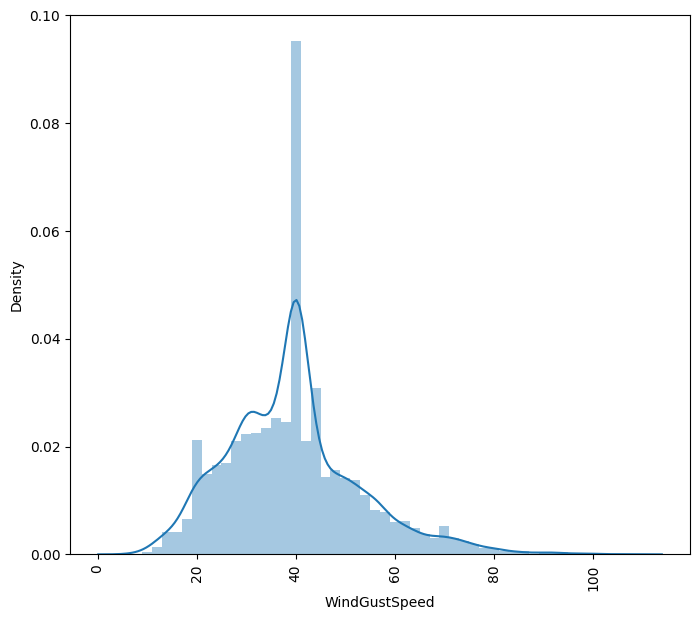

Mean :- 39.14438767751899


In [51]:
plt.figure(figsize=(8,7))
sns.distplot(df['WindGustSpeed'])
plt.xticks(rotation=90)
plt.show()
print ('Mean :-',df['WindGustSpeed'].mean())

#### The direction of the strongest wind gust in the 24 hours to midnight and its average 39

# B. Bivariate Analysis


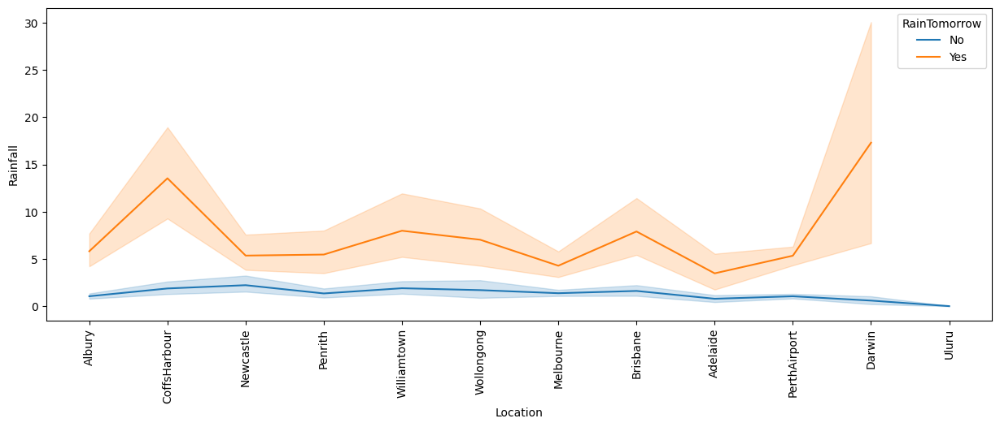

In [53]:
#Let us find the rainfall at different location
plt.figure(figsize=(15,5))
plt.xticks(rotation=90)
sns.lineplot(x='Location',y='Rainfall',hue='RainTomorrow',data=df)
plt.show()

### Darwin and CoffsHarbour seems to be having the maximum chances of rainfall tommorrow and Uluru seems to be least having the chance

<Figure size 1000x1000 with 0 Axes>

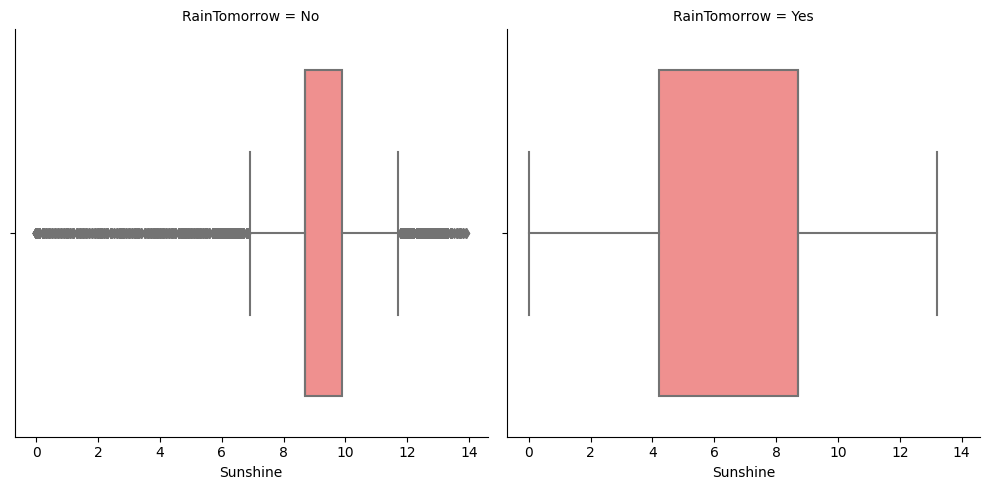

In [54]:
plt.figure(figsize = (10,10))
sns.catplot(x='Sunshine',col='RainTomorrow',data=df,kind='box',palette="spring")
plt.show()

### If we have sunlight from 8hrs to 10+ hrs in a day tomorrow the probability of rainfall is less and if we have sunlight for 4 to 8.5 hrs chances of rain are possible tomorrow

<Figure size 1000x1000 with 0 Axes>

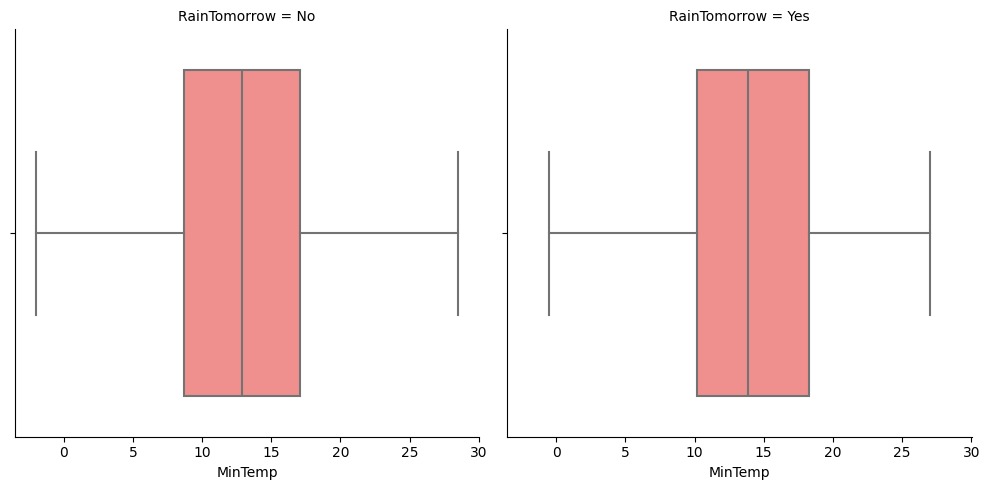

In [55]:
plt.figure(figsize = (10,10))
sns.catplot(x='MinTemp',col='RainTomorrow',data=df,kind='box',palette="spring")
plt.show()

### When the min temp is between 10 to 19 there are possibility of rain tomorrow


<Figure size 1000x1000 with 0 Axes>

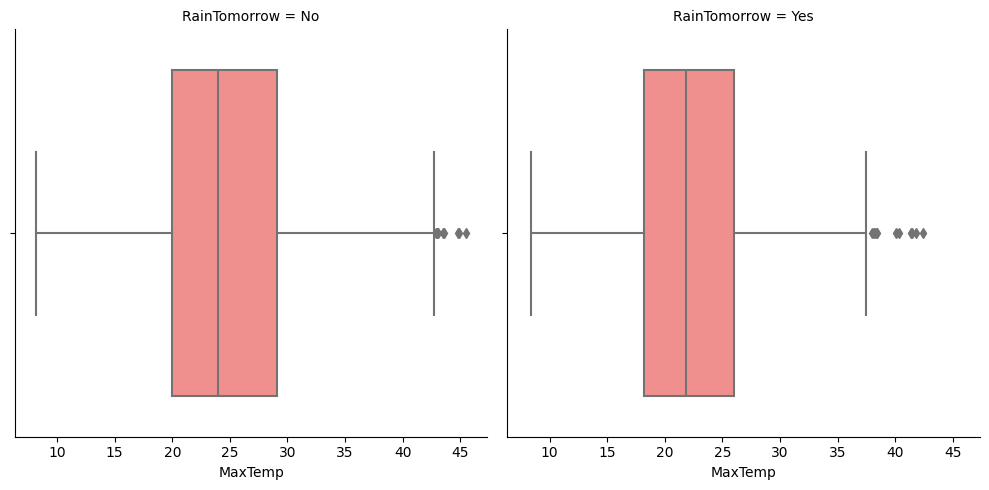

In [56]:
plt.figure(figsize = (10,10))
sns.catplot(x='MaxTemp',col='RainTomorrow',data=df,kind='box',palette="spring")
plt.show()

### When the Max temp is between 18 to 27 there are possibility of rain tomorrow


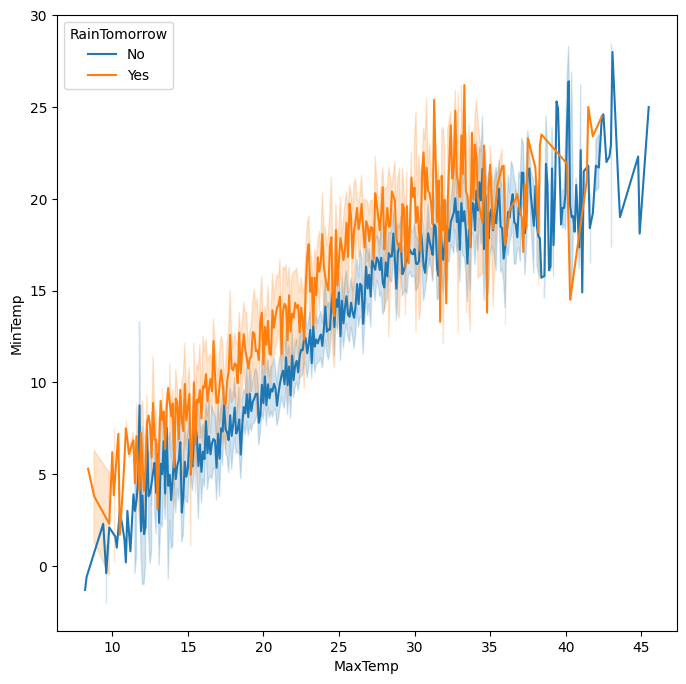

In [57]:
plt.figure(figsize=(8,8))
sns.lineplot( x = "MaxTemp",y = "MinTemp", data = df,hue="RainTomorrow")
plt.show()

### We can see that MinTemp and MaxTemp have Linear Relationship to rain tomorrow column,There is slight change in Min and Max temp for the occurance of rainfall tomorrow

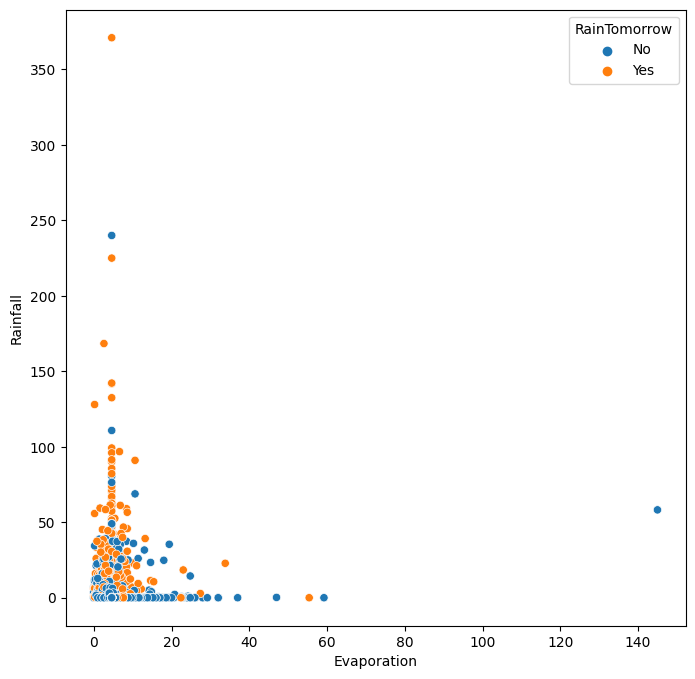

In [58]:
plt.figure(figsize=(8,8))
sns.scatterplot( x = "Evaporation",y = "Rainfall", data = df,hue="RainTomorrow")
plt.show()

### Till evaportation 5mm we see the maximum rainfall and if we have 5mm evaporation tomorrow we can expect rainfall

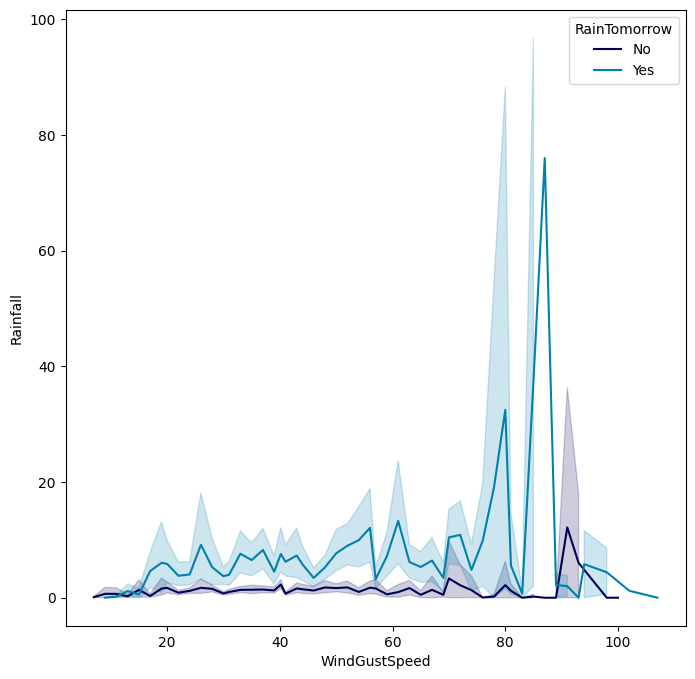

In [59]:
plt.figure(figsize=(8,8))
sns.lineplot( y = "Rainfall",x = "WindGustSpeed", data = df,hue="RainTomorrow",palette="ocean")
plt.show()

### If we have a Wind Speed of 80 to 90 there are max chances of rainfall tommorrow

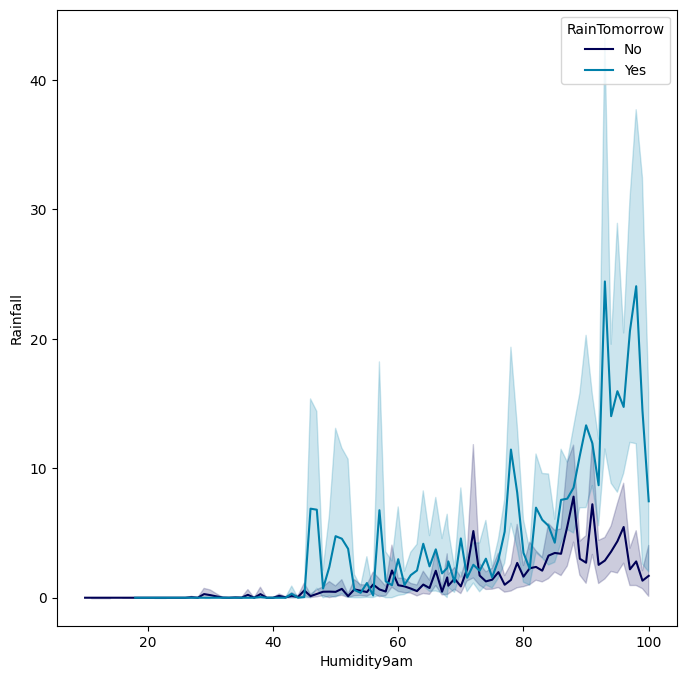

In [60]:
plt.figure(figsize=(8,8))
sns.lineplot( y = "Rainfall",x = "Humidity9am", data = df,hue="RainTomorrow",palette="ocean")
plt.show()

### if we have a humidity of max 83 to 100 ,there are max possibility of rainfall tomorrow at 9am

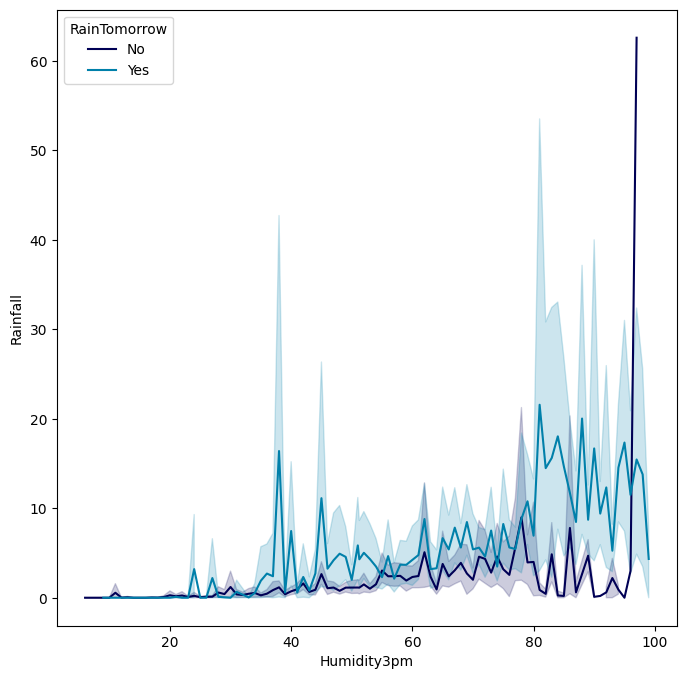

In [61]:
plt.figure(figsize=(8,8))
sns.lineplot( y = "Rainfall",x = "Humidity3pm", data = df,hue="RainTomorrow",palette="ocean")
plt.show()

### It is the same as 9am if we have a humidity of max 83 to 100 ,there are max possibility of rainfall tomorrow

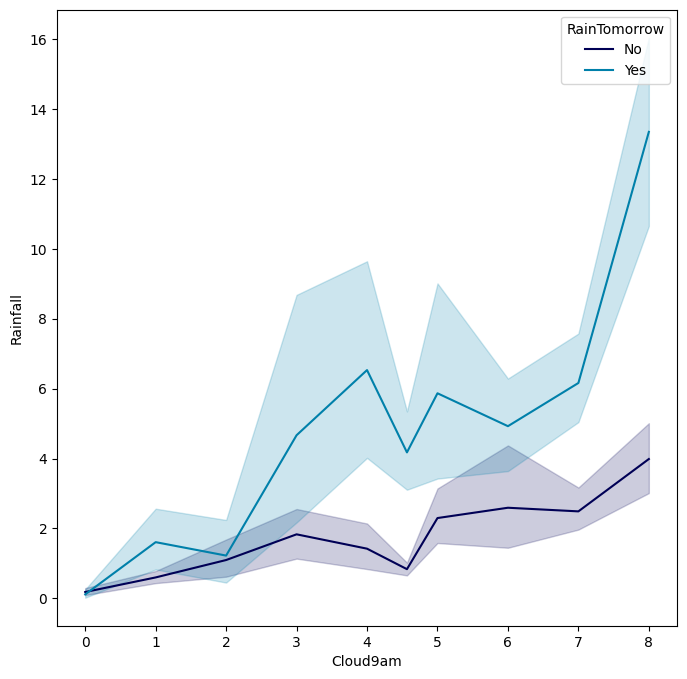

In [62]:
plt.figure(figsize=(8,8))
sns.lineplot( y = "Rainfall",x = "Cloud9am", data = df,hue="RainTomorrow",palette="ocean")
plt.show()

### if we have 2-5 Fraction of sky obscured by cloud ,there are possibility of rainfall tomorrow at 9am

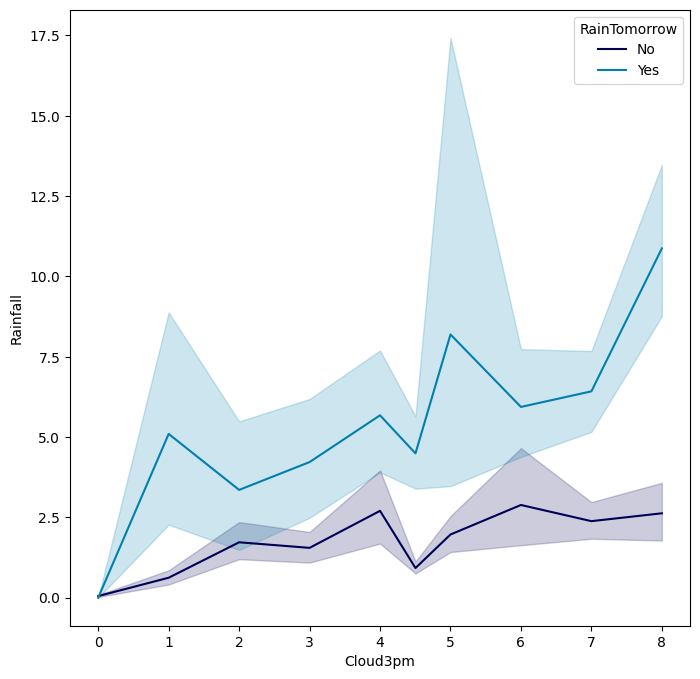

In [63]:
plt.figure(figsize=(8,8))
sns.lineplot( y = "Rainfall",x = "Cloud3pm", data = df,hue="RainTomorrow",palette="ocean")
plt.show()

### if we have 4-6 Fraction of sky obscured by cloud ,there are possibility of rainfall tomorrow at 3pm

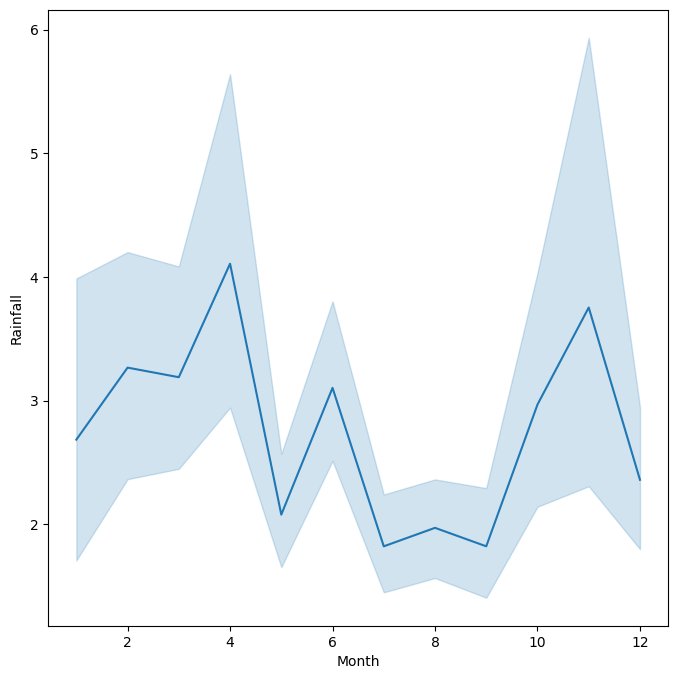

In [64]:
plt.figure(figsize=(8,8))
sns.lineplot( y = "Rainfall",x = "Month", data = df,palette="ocean")
plt.show()


#### Here have Observed that rainfall in Australia has been taken place in march, april ,october and November

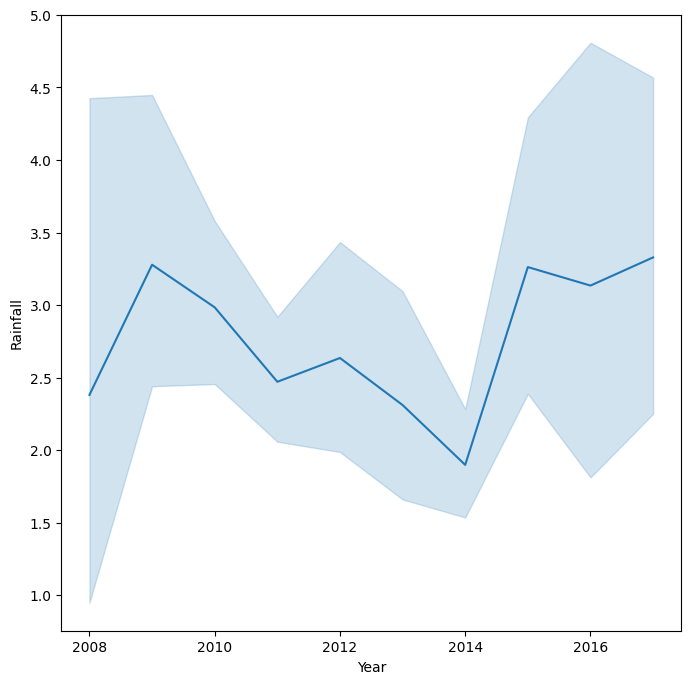

In [65]:
plt.figure(figsize=(8,8))
sns.lineplot( y = "Rainfall",x = "Year", data = df,palette="ocean")
plt.show()

### In year 2009 and 2015 maximum rainfall have been taken place above 3mm and 2014 seems to be the least

# C. Multi-variate Analysis


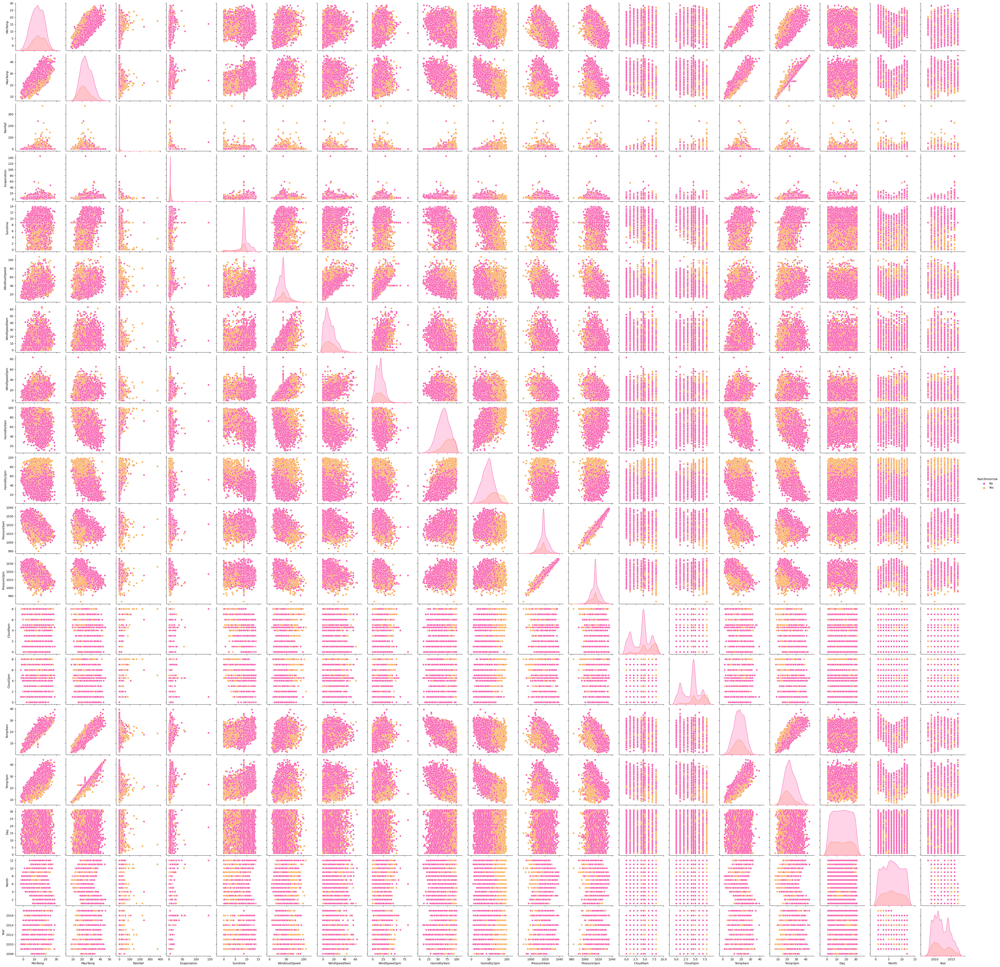

In [66]:
# Checking the pairwise relation in the dataset.
sns.pairplot(df,hue="RainTomorrow",palette="spring")

#### This pair plot gives the pairwise relation between the columns which is plotted on the basis of target variable "RainTomorrow". Here we can observe the relation between the features and label.

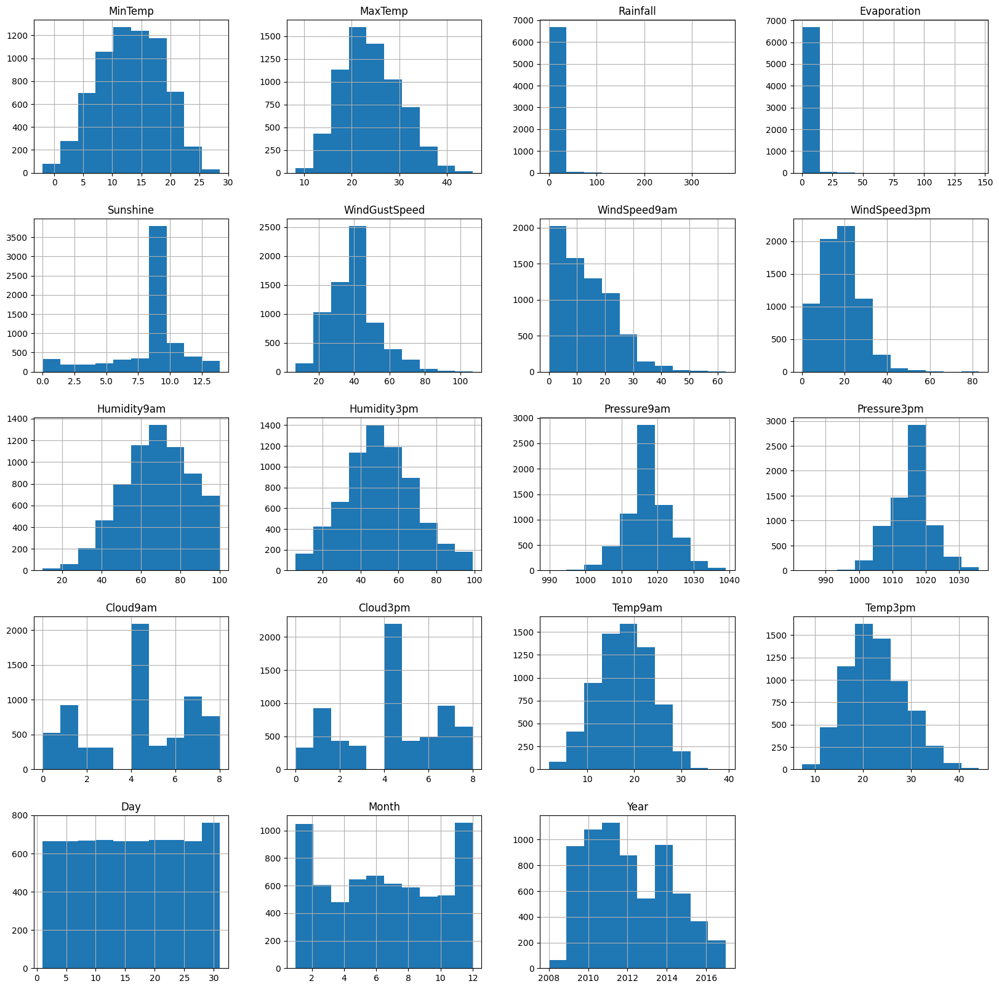

In [67]:
df.hist(bins=10, figsize=(20,20))
plt.show()

#### We can see in Negative columns lot of skewness is present. We are gonna a correct it later


MinTemp             Axes(0.125,0.747241;0.133621x0.132759)
MaxTemp          Axes(0.285345,0.747241;0.133621x0.132759)
Rainfall          Axes(0.44569,0.747241;0.133621x0.132759)
Evaporation      Axes(0.606034,0.747241;0.133621x0.132759)
Sunshine         Axes(0.766379,0.747241;0.133621x0.132759)
WindGustSpeed       Axes(0.125,0.587931;0.133621x0.132759)
WindSpeed9am     Axes(0.285345,0.587931;0.133621x0.132759)
WindSpeed3pm      Axes(0.44569,0.587931;0.133621x0.132759)
Humidity9am      Axes(0.606034,0.587931;0.133621x0.132759)
Humidity3pm      Axes(0.766379,0.587931;0.133621x0.132759)
Pressure9am         Axes(0.125,0.428621;0.133621x0.132759)
Pressure3pm      Axes(0.285345,0.428621;0.133621x0.132759)
Cloud9am          Axes(0.44569,0.428621;0.133621x0.132759)
Cloud3pm         Axes(0.606034,0.428621;0.133621x0.132759)
Temp9am          Axes(0.766379,0.428621;0.133621x0.132759)
Temp3pm              Axes(0.125,0.26931;0.133621x0.132759)
Day               Axes(0.285345,0.26931;0.133621x0.13275

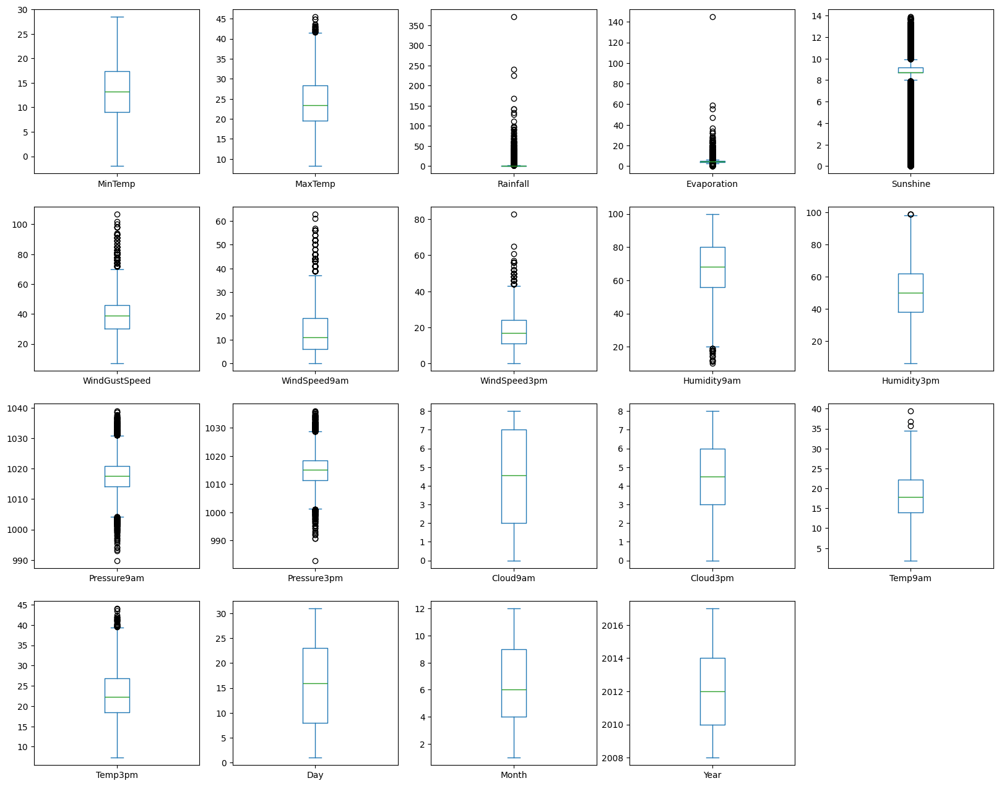

In [68]:
df.plot(kind='box',subplots=True,layout=(5,5),figsize=(20,20))


#### We can see that many columns have Outliers Present in the dataset


# CORRELATION


## Lets Convert all catagorical columns to into int format By Encoding

In [69]:
from sklearn.preprocessing import LabelEncoder


In [70]:
df.dtypes


Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
Day                int32
Month              int32
Year               int32
dtype: object

In [71]:
#Lets convert all catagorical columns to Int format

le = LabelEncoder()
Input = ['Location','WindGustDir','WindDir9am','WindDir3pm','RainToday','RainTomorrow']

for i in Input:
    df[i] = le.fit_transform(df[i])

In [72]:
df.dtypes


Location           int32
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir        int32
WindGustSpeed    float64
WindDir9am         int32
WindDir3pm         int32
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday          int32
RainTomorrow       int32
Day                int32
Month              int32
Year               int32
dtype: object

In [73]:
df.corr()


,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
Location,1.000000,0.090489,0.070721,-0.004972,0.134965,0.067920,-0.074300,0.262774,-0.088884,-0.001275,0.240984,0.230088,-0.033612,-0.001340,-0.037507,-0.023255,-0.011615,-0.013584,0.098478,0.066192,-0.004280,-0.004506,-0.000710,-0.067376,0.503047
MinTemp,0.090489,1.000000,0.728026,0.091021,0.284674,0.012003,-0.150920,0.242385,-0.021014,-0.139514,0.169532,0.187757,-0.154199,0.067548,-0.441335,-0.440895,0.087811,0.040744,0.891378,0.696582,0.075869,0.097202,0.014370,-0.237234,0.033086
MaxTemp,0.070721,0.728026,1.000000,-0.087556,0.356440,0.333129,-0.216905,0.164813,-0.192138,-0.161059,0.057106,0.115632,-0.425145,-0.430898,-0.337846,-0.413425,-0.246459,-0.243461,0.866664,0.974840,-0.225448,-0.159976,0.016122,-0.171509,0.080913
Rainfall,-0.004972,0.091021,-0.087556,1.000000,-0.003746,-0.191051,0.035572,0.088968,0.091260,0.031770,0.050370,0.020183,0.227951,0.242908,-0.071062,-0.032658,0.191712,0.159476,-0.004340,-0.091880,0.461817,0.223599,-0.007989,-0.015187,-0.008516
Evaporation,0.134965,0.284674,0.356440,-0.003746,1.000000,0.256665,-0.090193,0.175897,-0.073454,-0.039664,0.168313,0.137342,-0.269758,-0.195471,-0.202540,-0.218159,-0.090761,-0.133520,0.338005,0.347886,-0.113699,-0.077340,0.011120,-0.002998,0.114748
Sunshine,0.067920,0.012003,0.333129,-0.191051,0.256665,1.000000,-0.108390,-0.008581,-0.090944,-0.044945,-0.038485,0.016065,-0.342239,-0.434451,0.002387,-0.051962,-0.511430,-0.538255,0.199727,0.353711,-0.252476,-0.341003,0.000948,-0.005628,0.116439
WindGustDir,-0.074300,-0.150920,-0.216905,0.035572,-0.090193,-0.108390,1.000000,0.000480,0.385221,0.502140,0.015291,0.106009,0.040937,0.048025,-0.110879,-0.029383,0.121621,0.088311,-0.171100,-0.231060,0.123042,0.048487,0.011975,0.041334,-0.122957
WindGustSpeed,0.262774,0.242385,0.164813,0.088968,0.175897,-0.008581,0.000480,1.000000,-0.075987,0.078794,0.584105,0.615217,-0.265362,-0.092423,-0.394086,-0.363669,0.007703,0.053480,0.221060,0.129193,0.085796,0.184221,-0.003636,0.050615,-0.018529
WindDir9am,-0.088884,-0.021014,-0.192138,0.091260,-0.073454,-0.090944,0.385221,-0.075987,1.000000,0.216648,0.056413,0.044693,0.015462,0.126407,-0.027671,0.050710,0.079419,0.058235,-0.070937,-0.200949,0.157884,0.040399,-0.014730,0.019799,-0.062314
WindDir3pm,-0.001275,-0.139514,-0.161059,0.031770,-0.039664,-0.044945,0.502140,0.078794,0.216648,1.000000,0.010819,0.085263,-0.005558,-0.009464,-0.139020,-0.049299,0.072567,0.052121,-0.146479,-0.175048,0.094507,0.004301,0.001723,0.034494,0.010694


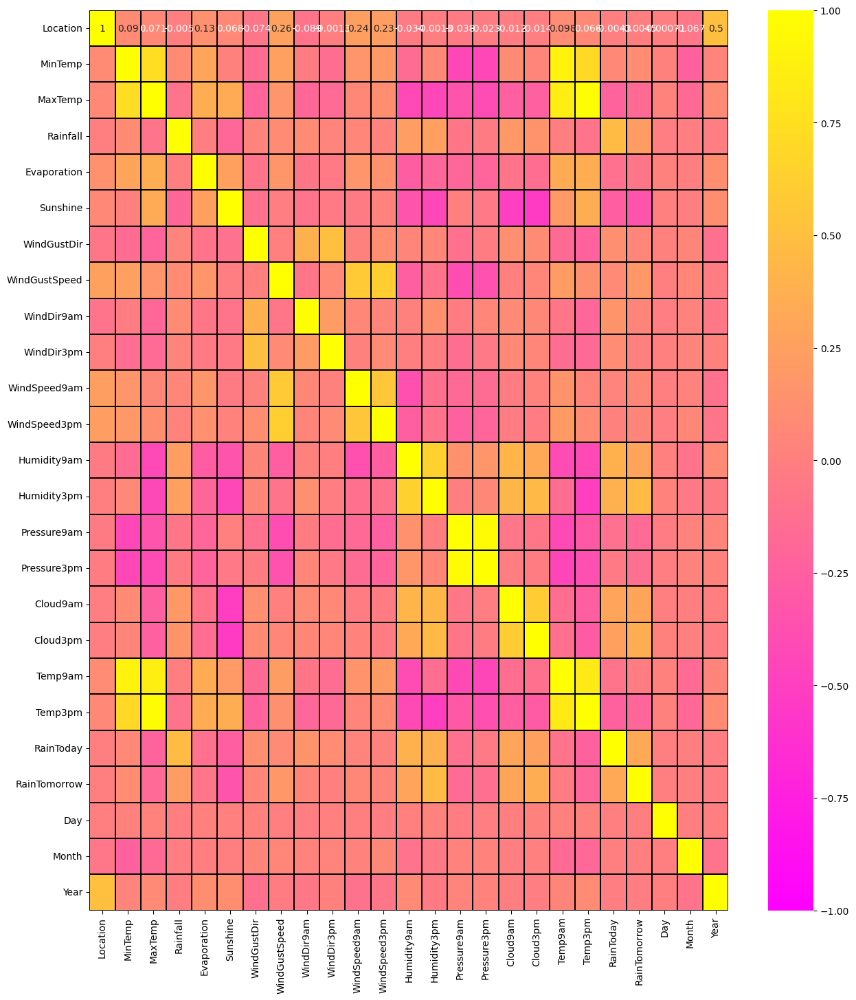

In [74]:
# Visualizing the correlation matrix by plotting heat map.
plt.figure(figsize=(15,17))
sns.heatmap(df.corr(),linewidths=.1,vmin=-1, vmax=1, fmt='.2g', annot = True, linecolor="black",annot_kws={'size':10},cmap="spring")
plt.yticks(rotation=0);

### This heatmap shows the correlation matrix by visualizing the data. we can observe the relation between feature to feature and feature to label. This heat mapcontains both positive and negative correlation.

In [75]:
df.corr()['RainTomorrow'].sort_values()


Sunshine        -0.341003
Temp3pm         -0.202900
MaxTemp         -0.159976
Pressure9am     -0.159095
Pressure3pm     -0.131685
Evaporation     -0.077340
Temp9am         -0.025813
Year            -0.014769
Day             -0.007560
Location        -0.004506
Month           -0.003575
WindDir3pm       0.004301
WindDir9am       0.040399
WindSpeed3pm     0.043186
WindGustDir      0.048487
WindSpeed9am     0.058026
MinTemp          0.097202
WindGustSpeed    0.184221
Rainfall         0.223599
Humidity9am      0.287796
Cloud9am         0.294176
RainToday        0.323691
Cloud3pm         0.356770
Humidity3pm      0.466750
RainTomorrow     1.000000
Name: RainTomorrow, dtype: float64

### We can see that some columns are Negatively correlated and some are positively correlated ..Max positively correlated column is :- Humidity3pm and Max Negetively column is :- Sunshine

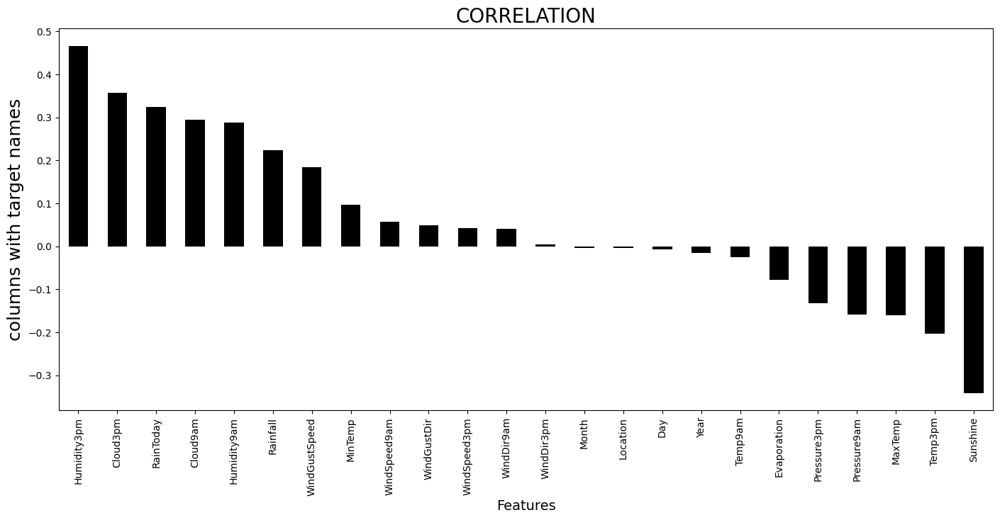

In [76]:
#checking the columns which are positively and negatively correlated

plt.figure(figsize=(17,7))
df.corr()['RainTomorrow'].sort_values(ascending=False).drop(['RainTomorrow']).plot(kind='bar',color='black')
plt.xlabel('Features',fontsize=14)
plt.ylabel('columns with target names',fontsize=18)
plt.title('CORRELATION',fontsize=20)
plt.show()


### Here we can see the least correlated columns are-> month and the max postive and Negative correlated columns as Humidity3pm and Sunshine.

In [77]:
# Now Drop the least correlated columns ,i find 'Month' as least correlated
df.drop("Month",axis=1,inplace=True)

# DESCRIPTIVE STATISTICS

In [79]:
# Statistical description of our dataset
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Location,6762.0,5.323721,3.099455,0.0,2.25,6.000000,8.0,11.0
MinTemp,6762.0,13.111121,5.540700,-2.0,9.00,13.200000,17.4,28.5
MaxTemp,6762.0,24.091615,6.130557,8.2,19.60,23.400000,28.4,45.5
Rainfall,6762.0,2.723410,10.490138,0.0,0.00,0.000000,0.8,371.0
Evaporation,6762.0,4.998980,3.361770,0.0,4.00,4.600000,5.0,145.0
Sunshine,6762.0,8.278098,2.763362,0.0,8.70,8.700000,9.2,13.9
WindGustDir,6762.0,7.028394,4.790116,0.0,3.00,7.000000,12.0,15.0
WindGustSpeed,6762.0,39.144388,13.382876,7.0,30.00,39.000000,46.0,107.0
WindDir9am,6762.0,7.013310,4.550702,0.0,3.00,7.000000,11.0,15.0
WindDir3pm,6762.0,7.842798,4.486894,0.0,4.00,9.000000,12.0,15.0


### We can see all columns having count 6762 . Looks like it doesn't contain missing values .

<Axes: >

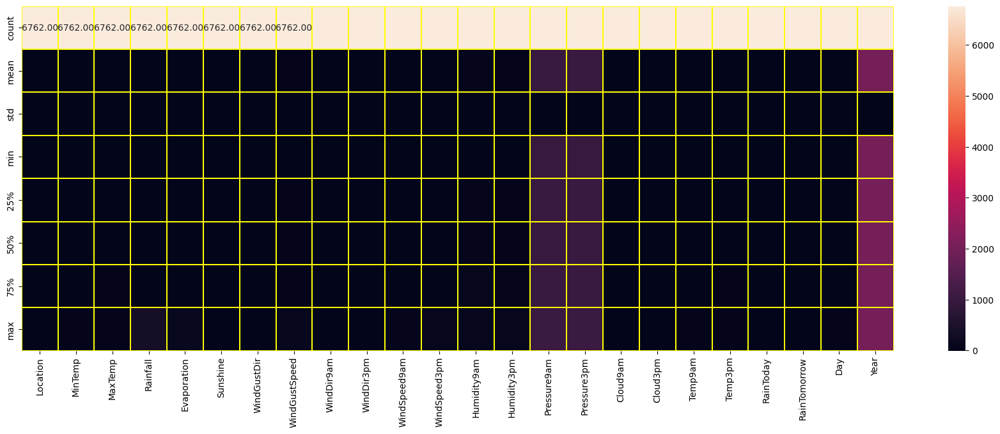

In [80]:
plt.figure(figsize=(22,7))
sns.heatmap(df.describe(),annot=True,linewidths=0.2,linecolor="yellow",fmt="0.2f")

### Outcome of describe() of dataset :-
#### from the above plotting we are determining mean,standard deviation,minimum and maximum value of each column

#### Total number rows and column in dataset:-

### Rows :- 6762

### columns :- 24

# Lets Check Skewness


In [81]:
df.skew()


Location         -0.000009
MinTemp          -0.084774
MaxTemp           0.330804
Rainfall         13.637400
Evaporation      13.603792
Sunshine         -1.265205
WindGustDir       0.181462
WindGustSpeed     0.742028
WindDir9am        0.220355
WindDir3pm       -0.123726
WindSpeed9am      0.953847
WindSpeed3pm      0.545217
Humidity9am      -0.256616
Humidity3pm       0.149053
Pressure9am       0.020745
Pressure3pm       0.031664
Cloud9am         -0.291165
Cloud3pm         -0.227885
Temp9am          -0.046686
Temp3pm           0.349901
RainToday         1.266937
RainTomorrow      1.266937
Day               0.006240
Year              0.354481
dtype: float64

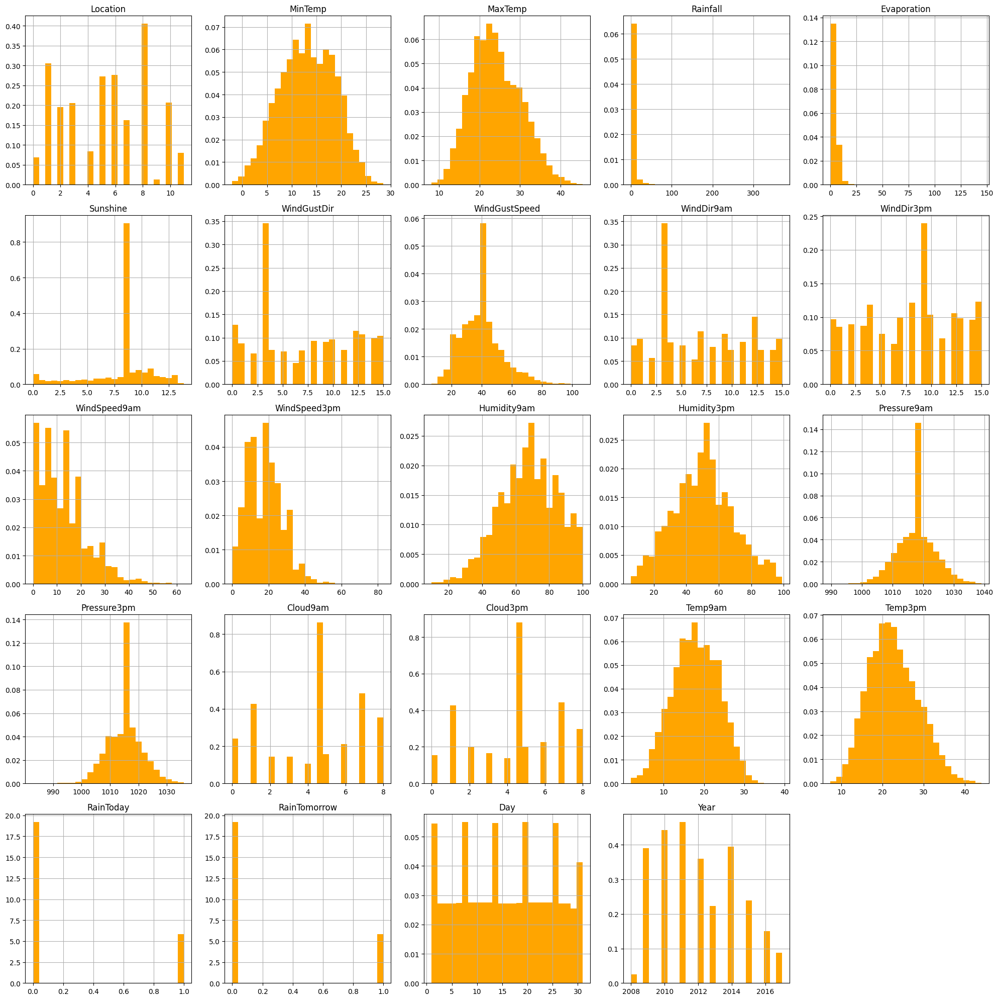

In [82]:
#Lets plot all using Histogram and see the skewness again
 
plt.rcParams['figure.figsize']=(20,20)
df.hist(bins=25,color='orange',density=True,label='Value',histtype='bar')
plt.tight_layout()
plt.show()

### Rainfall,Evaporation,Sunshine,WindSpeed9am,WindSpeed3pm have skewness present and rest all columns are catagorical so no need to remove skewness

# Now Lets Remove Outliers Now


## ZSCORE METHOD


In [83]:
# Features containing outliers from Numerical Columns

features = df[['MaxTemp','Rainfall','Evaporation','Sunshine','Humidity9am','Humidity3pm','Pressure9am','Pressure3pm','Temp3pm']]

# Using zscore to remove outliers
from scipy.stats import zscore

z=np.abs(zscore(features))

z

,MaxTemp,Rainfall,Evaporation,Sunshine,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Temp3pm
0,0.194387,0.202435,0.11869,0.152688,0.203179,1.539598,1.647292,1.347736,0.151545
1,0.164497,0.259635,0.11869,0.152688,1.368283,1.377411,1.166162,1.230431,0.267112
2,0.262375,0.259635,0.11869,0.152688,1.717496,1.107100,1.663883,1.079611,0.082903
3,0.637572,0.259635,0.11869,0.152688,1.310080,1.863971,0.004812,0.392542,0.635529
4,1.339029,0.164301,0.11869,0.152688,0.843405,0.944913,1.132980,1.532071,1.171410
...,...,...,...,...,...,...,...,...,...
8420,0.112823,0.259635,0.11869,0.152688,0.960867,1.431473,1.156538,0.864293,0.051067
8421,0.197123,0.259635,0.11869,0.152688,0.669855,1.593660,0.974040,0.663199,0.300604
8422,0.458130,0.259635,0.11869,0.152688,0.844462,1.431473,0.559272,0.277770,0.568544
8423,0.474443,0.259635,0.11869,0.152688,0.960867,1.431473,0.293821,0.227497,0.551798


In [84]:
# Creating new dataframe
df_new = df[(z<3).all(axis=1)] 
df_new

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Year
0,1,13.4,22.9,0.6,4.6,8.7,13,44.000000,13,14,20.0,24.0,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,0,0,1,2008
1,1,7.4,25.1,0.0,4.6,8.7,14,44.000000,6,15,4.0,22.0,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,0,0,2,2008
2,1,12.9,25.7,0.0,4.6,8.7,15,46.000000,13,15,19.0,26.0,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,0,0,3,2008
3,1,9.2,28.0,0.0,4.6,8.7,4,24.000000,9,0,11.0,9.0,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,0,0,4,2008
4,1,17.5,32.3,1.0,4.6,8.7,13,41.000000,1,7,7.0,20.0,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,0,0,5,2008
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,9,2.8,23.4,0.0,4.6,8.7,0,31.000000,9,1,13.0,11.0,51.0,24.0,1024.6,1020.3,4.566622,4.503183,10.1,22.4,0,0,21,2017
8421,9,3.6,25.3,0.0,4.6,8.7,6,22.000000,9,3,13.0,9.0,56.0,21.0,1023.5,1019.1,4.566622,4.503183,10.9,24.5,0,0,22,2017
8422,9,5.4,26.9,0.0,4.6,8.7,3,37.000000,9,14,9.0,9.0,53.0,24.0,1021.0,1016.8,4.566622,4.503183,12.5,26.1,0,0,23,2017
8423,9,7.8,27.0,0.0,4.6,8.7,9,28.000000,10,3,13.0,7.0,51.0,24.0,1019.4,1016.5,3.000000,2.000000,15.1,26.0,0,0,24,2017


In [85]:
df_new.shape


(6532, 24)

In [86]:
df.shape


(6762, 24)

In [87]:
# Percentage of data loss

DataLoss=((6762-6532)/6762)*100
DataLoss

3.4013605442176873

### 3.4013605442176873% is the data lossed during removal of Outliers by ZScore Method
## IQR METHOD

In [88]:
#1st quantile
Q1=df.quantile(0.25)

# 3rd quantile
Q3=df.quantile(0.75)

#IQR
IQR=Q3 - Q1
qq=df[~((df < (Q1 - 1.5 * IQR)) |(df > (Q3 + 1.5 * IQR))).any(axis=1)]

In [89]:
print("Old DataFrame data in Rows and Column:",df.shape)
print("\nNew DataFrame data in Rows and Column:",qq.shape)
print("\nTotal Dropped rows:",df.shape[0]-qq.shape[0])

Old DataFrame data in Rows and Column: (6762, 24)

New DataFrame data in Rows and Column: (2093, 24)

Total Dropped rows: 4669


In [90]:
#Percentage Data Loss using IQR
data_loss1 = (6762-2093)/6762*100
data_loss1

69.04761904761905

## 69.04761904761905% is the data lossed during removal of Outliers by IQR Method
## SO HERE WE WILL GO WITH ZSCORE METHOD BECAUSE IT HAS LESS DATALOSS AS COMPARED TO IQR

# *Now Lets Remove Skewness Now*


In [91]:
L1=['Rainfall','Evaporation','Sunshine','WindSpeed9am','WindSpeed3pm']


In [92]:
# Lets remove the skewness from given columns by Power Transform Method

from sklearn.preprocessing import PowerTransformer
PT = PowerTransformer(method='yeo-johnson')

In [93]:
df['Rainfall']


0       0.6
1       0.0
2       0.0
3       0.0
4       1.0
       ... 
8420    0.0
8421    0.0
8422    0.0
8423    0.0
8424    0.0
Name: Rainfall, Length: 6762, dtype: float64

In [94]:
#Removing skewness using yeo-johnson
df_new[['Rainfall','Evaporation','Sunshine','WindSpeed9am','WindSpeed3pm']] = PT.fit_transform(df_new[['Rainfall','Evaporation','Sunshine','WindSpeed9am','WindSpeed3pm']].values)


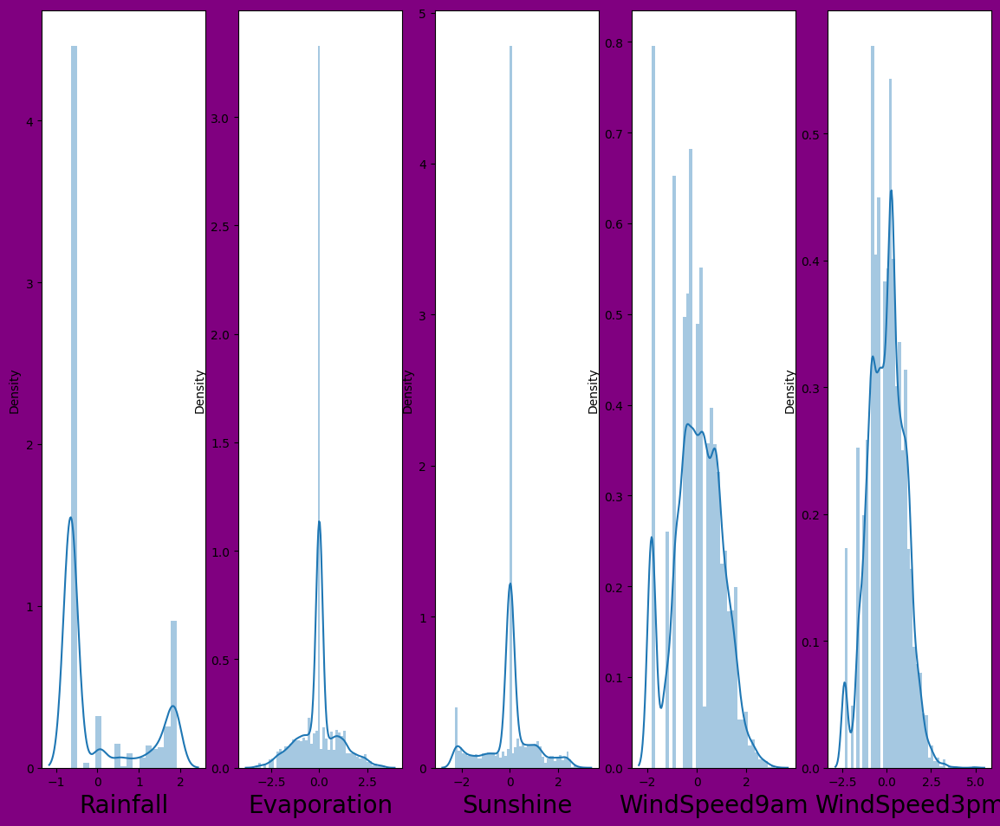

In [95]:
#After removing let's check how the data has been distributed in each column of skew_features.

plt.figure(figsize=(20,25), facecolor='purple')
plotnumber = 1

for column in df_new[L1]:
    if plotnumber<=9:
        ax = plt.subplot(2,7,plotnumber)
        sns.distplot(df_new[column])
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.show()

## We can see that all the columns have been Normalized now and skewness have been removed
## Now Lets Split the dataset into dependent and independent variable

In [96]:
df_new.head()


,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Year
0,1,13.4,22.9,0.804420,0.013789,0.017255,13,44.0,13,14,0.840218,0.724508,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,0,0,1,2008
1,1,7.4,25.1,-0.646505,0.013789,0.017255,14,44.0,6,15,-0.855037,0.537821,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,0,0,2,2008
2,1,12.9,25.7,-0.646505,0.013789,0.017255,15,46.0,13,15,0.762898,0.906090,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,0,0,3,2008
3,1,9.2,28.0,-0.646505,0.013789,0.017255,4,24.0,9,0,0.047334,-0.861238,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,0,0,4,2008
4,1,17.5,32.3,1.167595,0.013789,0.017255,13,41.0,1,7,-0.414729,0.345422,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,0,0,5,2008


In [97]:
x=df_new.loc [:,df_new.columns != 'RainTomorrow']
# Independent Variable

In [98]:
y=df_new.loc[:,'RainTomorrow']
#Dependent Variable

In [99]:
x.shape


(6532, 23)

In [100]:
y.shape


(6532,)

## Now Lets Scale The Dataset

In [102]:
from sklearn.preprocessing import StandardScaler


In [103]:
sc=StandardScaler()

x= pd.DataFrame(sc.fit_transform(x), columns=x.columns)
x

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,Day,Year
0,-1.400036,0.065622,-0.190499,0.804420,0.013789,0.017255,1.253175,0.388402,1.323060,1.376012,0.840218,0.724508,0.211682,-1.552536,-1.729946,-1.415927,1.468596,0.068250,-0.165993,-0.147964,-0.535101,-1.672720,-1.767219
1,-1.400036,-1.020240,0.173266,-0.646505,0.013789,0.017255,1.462101,0.388402,-0.217679,1.599308,-0.855037,0.537821,-1.378948,-1.388035,-1.227518,-1.293379,0.080271,0.068250,-0.113212,0.276308,-0.535101,-1.558965,-1.767219
2,-1.400036,-0.024866,0.272474,-0.646505,0.013789,0.017255,1.671028,0.540294,1.323060,1.599308,0.762898,0.906090,-1.732422,-1.113868,-1.747271,-1.135817,0.080271,-1.011045,0.555342,0.089628,-0.535101,-1.445209,-1.767219
3,-1.400036,-0.694481,0.652774,-0.646505,0.013789,0.017255,-0.627163,-1.130513,0.442637,-1.750132,0.047334,-0.861238,-1.320036,-1.881536,-0.014762,-0.418037,0.080271,0.068250,0.045130,0.649667,-0.535101,-1.331454,-1.767219
4,-1.400036,0.807628,1.363770,1.167595,0.013789,0.017255,1.253175,0.160565,-1.318207,-0.187060,-0.414729,0.345422,0.859716,-0.949368,-1.192868,-1.608502,1.064235,1.575970,-0.007651,1.192734,-0.535101,-1.217699,-1.767219
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6527,1.197247,-1.852735,-0.107825,-0.646505,0.013789,0.017255,-1.462869,-0.598893,0.442637,-1.526836,0.246267,-0.616556,-0.966563,-1.442869,1.197994,0.894977,0.080271,0.068250,-1.362352,-0.046139,-0.535101,0.602388,2.172383
6528,1.197247,-1.707953,0.206335,-0.646505,0.013789,0.017255,-0.209310,-1.282405,0.442637,-1.080244,0.246267,-0.861238,-0.672002,-1.607369,1.007418,0.684895,0.080271,0.068250,-1.221604,0.310250,-0.535101,0.716144,2.172383
6529,1.197247,-1.382194,0.470892,-0.646505,0.013789,0.017255,-0.836090,-0.143218,0.442637,1.376012,-0.170863,-0.861238,-0.848738,-1.442869,0.574291,0.282237,0.080271,0.068250,-0.940108,0.581783,-0.535101,0.829899,2.172383
6530,1.197247,-0.947849,0.487427,-0.646505,0.013789,0.017255,0.417469,-0.826730,0.662743,-1.080244,0.246267,-1.123601,-0.966563,-1.442869,0.297090,0.229717,-0.553210,-1.011045,-0.482676,0.564812,-0.535101,0.943655,2.172383


## WE CHECK MULTICOLLINEARITY BY VARIANCE INFLATION FACTOR (VIF)


In [106]:
from statsmodels.stats.outliers_influence import variance_inflation_factor


In [107]:
def vif_cal():
    vif=pd.DataFrame()
    vif["VIF FACTOR"]=[variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
    vif["FEATURES"]=x.columns
    print (vif)

In [108]:
vif_cal()


    VIF FACTOR       FEATURES
0     1.626390       Location
1     8.753758        MinTemp
2    26.216770        MaxTemp
3     8.313454       Rainfall
4     1.728833    Evaporation
5     2.103665       Sunshine
6     1.632461    WindGustDir
7     2.095756  WindGustSpeed
8     1.358530     WindDir9am
9     1.484990     WindDir3pm
10    2.055513   WindSpeed9am
11    1.912736   WindSpeed3pm
12    4.167315    Humidity9am
13    5.404605    Humidity3pm
14   19.727720    Pressure9am
15   18.884431    Pressure3pm
16    1.972047       Cloud9am
17    1.910671       Cloud3pm
18   17.398288        Temp9am
19   32.145467        Temp3pm
20    7.639318      RainToday
21    1.003775            Day
22    1.536962           Year


In [110]:
x.drop('Temp3pm',axis=1,inplace=True)


## Many feature are highly multi related So we will drop Temp3pm as it have highest VIF values


In [111]:
def vif_cal():
    vif=pd.DataFrame()
    vif["VIF FACTOR"]=[variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
    vif["FEATURES"]=x.columns
    print (vif)

In [112]:
vif_cal()


    VIF FACTOR       FEATURES
0     1.625850       Location
1     8.666545        MinTemp
2     9.657296        MaxTemp
3     8.313183       Rainfall
4     1.728704    Evaporation
5     2.102851       Sunshine
6     1.628344    WindGustDir
7     2.082742  WindGustSpeed
8     1.356901     WindDir9am
9     1.484471     WindDir3pm
10    2.055438   WindSpeed9am
11    1.908961   WindSpeed3pm
12    3.718616    Humidity9am
13    3.719374    Humidity3pm
14   19.298606    Pressure9am
15   18.526370    Pressure3pm
16    1.971032       Cloud9am
17    1.902354       Cloud3pm
18   16.307061        Temp9am
19    7.639139      RainToday
20    1.003566            Day
21    1.536904           Year


In [113]:
# Removing other most multi corelated column

x.drop('Pressure9am',axis=1,inplace=True)

In [114]:
def vif_cal():
    vif=pd.DataFrame()
    vif["VIF FACTOR"]=[variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
    vif["FEATURES"]=x.columns
    print (vif)

In [115]:
vif_cal()


    VIF FACTOR       FEATURES
0     1.621982       Location
1     8.553162        MinTemp
2     9.317219        MaxTemp
3     8.298790       Rainfall
4     1.712077    Evaporation
5     2.095054       Sunshine
6     1.612595    WindGustDir
7     2.062283  WindGustSpeed
8     1.333196     WindDir9am
9     1.410944     WindDir3pm
10    2.048221   WindSpeed9am
11    1.903652   WindSpeed3pm
12    3.718262    Humidity9am
13    3.717016    Humidity3pm
14    1.455814    Pressure3pm
15    1.970200       Cloud9am
16    1.900342       Cloud3pm
17   16.265725        Temp9am
18    7.638828      RainToday
19    1.002802            Day
20    1.536188           Year


In [116]:
# Removing other most multi corelated column

x.drop('Temp9am',axis=1,inplace=True)

In [117]:
def vif_cal():
    vif=pd.DataFrame()
    vif["VIF FACTOR"]=[variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
    vif["FEATURES"]=x.columns
    print (vif)

In [118]:
vif_cal()


    VIF FACTOR       FEATURES
0     1.619869       Location
1     4.610546        MinTemp
2     5.555038        MaxTemp
3     8.293571       Rainfall
4     1.705047    Evaporation
5     2.083368       Sunshine
6     1.611398    WindGustDir
7     2.024111  WindGustSpeed
8     1.332107     WindDir9am
9     1.410725     WindDir3pm
10    2.029787   WindSpeed9am
11    1.852267   WindSpeed3pm
12    2.585354    Humidity9am
13    2.905001    Humidity3pm
14    1.451538    Pressure3pm
15    1.951415       Cloud9am
16    1.896860       Cloud3pm
17    7.638825      RainToday
18    1.002726            Day
19    1.531987           Year


#### Now all the multicollinearity have been removed from the dataset
## No Multicollinearity is present in the dataset...Here we can observe all the columns have VIF less than 10 which means we are free from multicollinearity problem. Let's move to buliding machine learning models...
## Balancing the dataset over here,otherwise it will be a baised dataset

In [120]:
from imblearn.over_sampling import SMOTE



In [121]:
smt=SMOTE()
x,y=smt.fit_resample(x,y)


In [122]:
x.shape

(10114, 20)

In [123]:
y.shape

(10114,)

<Axes: ylabel='count'>

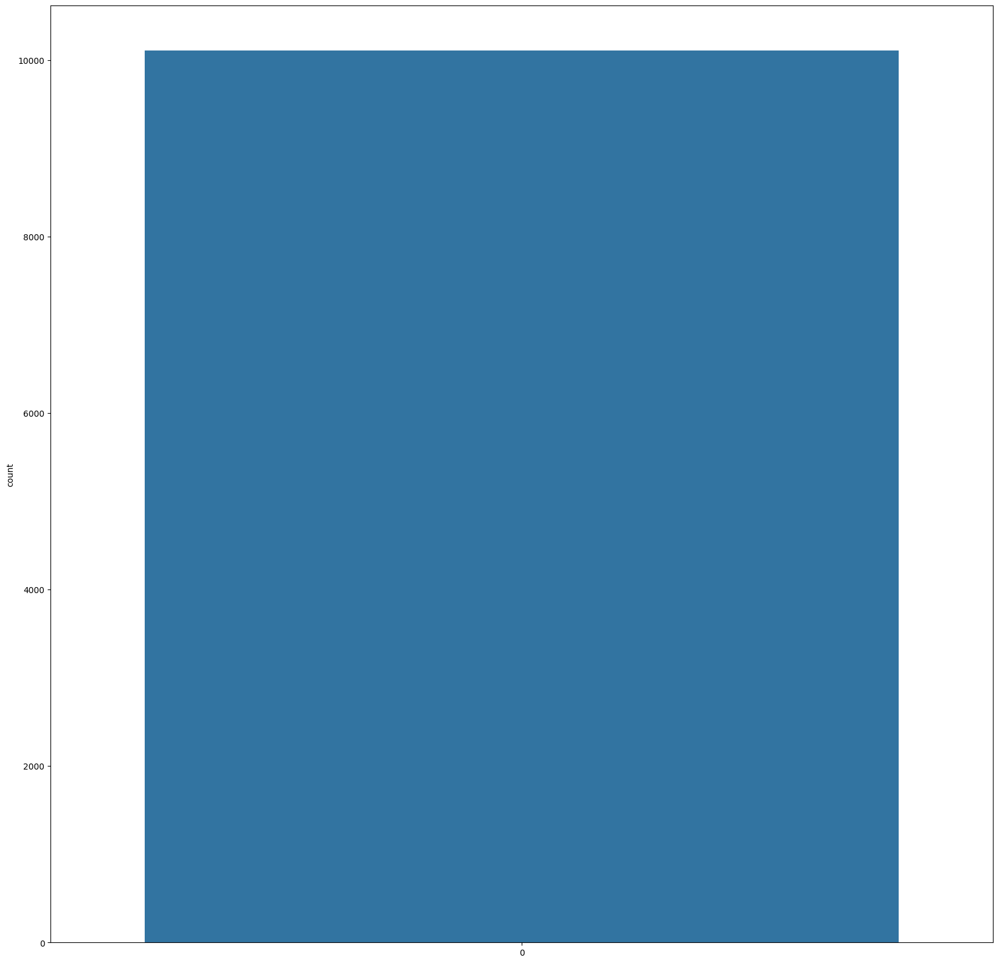

In [124]:
sns.countplot(y)


# Lets do PCA - Principal Component Analysis

In [126]:
from sklearn.decomposition import PCA


In [127]:
pca=PCA(n_components=10)


In [128]:
x=pca.fit_transform(x)
x

array([[ 0.10669989,  1.5188743 , -1.88775733, ..., -1.74047708,
        -0.09132701,  0.56904555],
       [ 1.63290134,  0.26646333, -2.20184961, ..., -2.89931761,
         0.23896563,  0.8524611 ],
       [ 1.94671493,  1.5347427 , -2.8473553 , ..., -1.38830846,
         0.40050354,  0.12142509],
       ...,
       [-2.25138112,  1.32575029,  1.98508706, ...,  0.22210688,
         0.32252916,  0.69051693],
       [-0.11446281,  1.29983324, -1.27056459, ...,  0.24342614,
        -0.42528816, -0.03675788],
       [-2.78098599,  4.0472373 , -2.30066543, ..., -1.27826473,
        -0.0188276 ,  0.20041201]])

## Now Our dataset is Reduced to n_component = 10Now Our dataset is Reduced to n_component = 10

In [129]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, accuracy_score
from sklearn.model_selection import train_test_split

In [130]:
lr=LogisticRegression()
for i in range(0,100):
    x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=i,test_size=0.20)
    lr.fit(x_train,y_train)
    pred_train=lr.predict(x_train)
    pred_test=lr.predict(x_test)
    if round(accuracy_score(pred_train,y_train)*100,1)==round(accuracy_score(y_test,pred_test)*100,1):
        print("At random state ",i," The model performs very well")
        print("At random_state:-",i)
        print("Training accuaracy_score is :-",round(accuracy_score(y_train,pred_train)*100,1))
        print("Testing accuracy_score is:-",round(accuracy_score(y_test,pred_test)*100,1),  '\n\n')

At random state  8  The model performs very well
At random_state:- 8
Training accuaracy_score is :- 76.3
Testing accuracy_score is:- 76.3 


At random state  45  The model performs very well
At random_state:- 45
Training accuaracy_score is :- 76.5
Testing accuracy_score is:- 76.5 


At random state  68  The model performs very well
At random_state:- 68
Training accuaracy_score is :- 76.4
Testing accuracy_score is:- 76.4 


At random state  78  The model performs very well
At random_state:- 78
Training accuaracy_score is :- 76.7
Testing accuracy_score is:- 76.7 


At random state  84  The model performs very well
At random_state:- 84
Training accuaracy_score is :- 76.5
Testing accuracy_score is:- 76.5 


At random state  86  The model performs very well
At random_state:- 86
Training accuaracy_score is :- 76.5
Testing accuracy_score is:- 76.5 


At random state  88  The model performs very well
At random_state:- 88
Training accuaracy_score is :- 76.6
Testing accuracy_score is:- 76.6 




In [131]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=88)


In [132]:
lr.fit(x_train,y_train)


LogisticRegression()

In [133]:
pred_train=lr.predict(x_train)


In [134]:
pred_test=lr.predict(x_test)


In [135]:
accuracy_score(y_test,pred_test)


0.7656945130993574

In [136]:
from sklearn.metrics import classification_report


In [137]:
print(classification_report(y_test,pred_test))


              precision    recall  f1-score   support

           0       0.76      0.78      0.77      1022
           1       0.77      0.76      0.76      1001

    accuracy                           0.77      2023
   macro avg       0.77      0.77      0.77      2023
weighted avg       0.77      0.77      0.77      2023



## CROSS VALIDATION FOR LOGISTICS REGRESSION


In [138]:
pred_lr=lr.predict(x_test)
from sklearn.model_selection import cross_val_score
lss=accuracy_score(y_test,pred_lr)

In [139]:
for i in range(2,10):
    lsscore=cross_val_score(lr,x,y,cv=i)
    lsc=lsscore.mean()
    print ("At cv:-",i)
    print ("Cross validation score is :-",lsc*100)
    print ("Accuracy_score is :-",lss*100)
    print ("\n")

At cv:- 2
Cross validation score is :- 72.41447498516906
Accuracy_score is :- 76.56945130993574


At cv:- 3
Cross validation score is :- 72.16752593674867
Accuracy_score is :- 76.56945130993574


At cv:- 4
Cross validation score is :- 70.48735068771867
Accuracy_score is :- 76.56945130993574


At cv:- 5
Cross validation score is :- 72.19769876880757
Accuracy_score is :- 76.56945130993574


At cv:- 6
Cross validation score is :- 72.35679764582476
Accuracy_score is :- 76.56945130993574


At cv:- 7
Cross validation score is :- 73.46322006071453
Accuracy_score is :- 76.56945130993574


At cv:- 8
Cross validation score is :- 73.20540382498623
Accuracy_score is :- 76.56945130993574


At cv:- 9
Cross validation score is :- 73.63198649891007
Accuracy_score is :- 76.56945130993574




In [140]:
# I will take CV as 9 bcz its close to accuracy score
lsscore_selected= cross_val_score(lr,x,y,cv=9).mean()
print ("The cv score is :- ",lsscore_selected,"\nThe accuracy_score is:",lss)

The cv score is :-  0.7363198649891006 
The accuracy_score is: 0.7656945130993574


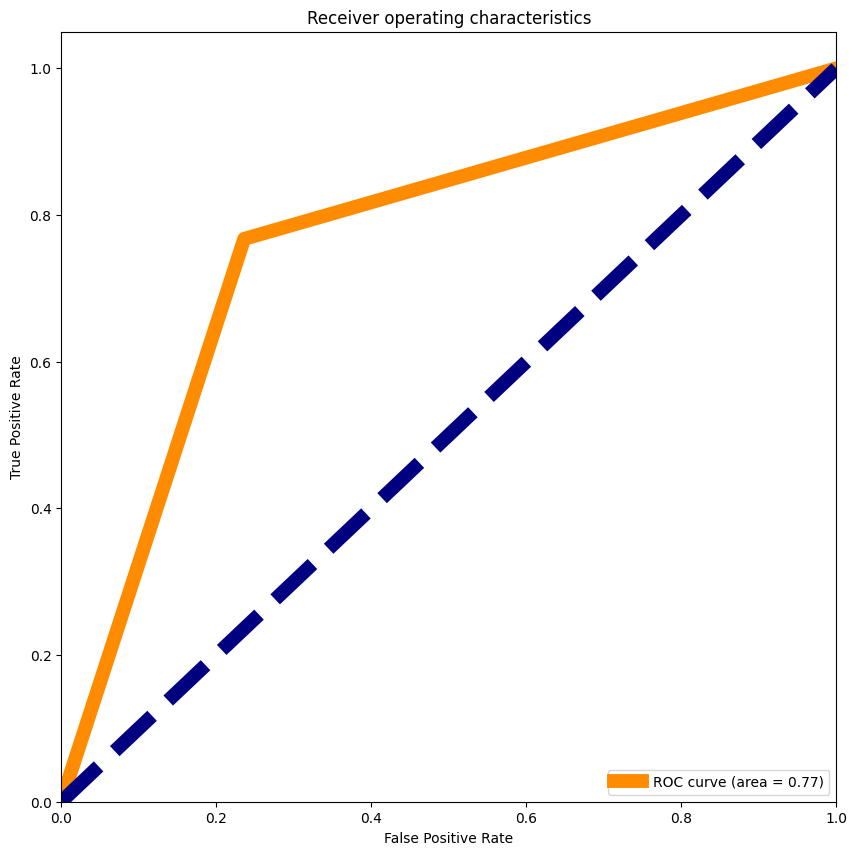

In [141]:
from sklearn.metrics import roc_curve,auc
fpr,tpr,threshold=roc_curve(pred_test,y_test)
roc_auc=auc(fpr,tpr)

plt.figure(figsize=(10,10))
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve (area = %0.2f)' %roc_auc)
plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristics')
plt.legend(loc="lower right")
plt.show()

### In Logistic regression 77% of the area is under Roc curve which is good
## DECISION TREE CLASSIFIER

In [142]:
# Checking Accuracy for Decision Tree Classifier
dt = DecisionTreeClassifier()
dt.fit(x_train,y_train)

#Prediction
preddt = dt.predict(x_test)

print(accuracy_score(y_test, preddt))
print(confusion_matrix(y_test, preddt))
print(classification_report(y_test,preddt))
print('CV  :-',cross_val_score(dt,x,y,cv=5).mean())

0.7790410281759763
[[765 257]
 [190 811]]
              precision    recall  f1-score   support

           0       0.80      0.75      0.77      1022
           1       0.76      0.81      0.78      1001

    accuracy                           0.78      2023
   macro avg       0.78      0.78      0.78      2023
weighted avg       0.78      0.78      0.78      2023

CV  :- 0.7019045076574878


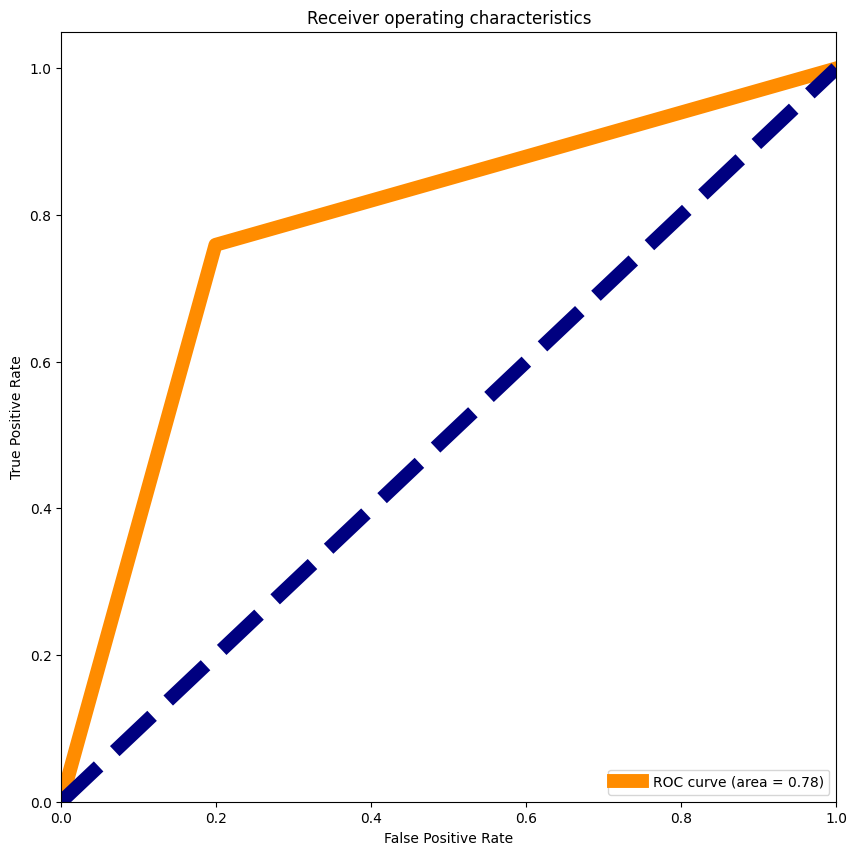

In [143]:
fpr,tpr,threshold=roc_curve(preddt,y_test)
roc_auc=auc(fpr,tpr)

plt.figure(figsize=(10,10))
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve (area = %0.2f)' %roc_auc)
plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristics')
plt.legend(loc="lower right")
plt.show()

#### We can see that 79% of area is inside AUC ROC curve Which is good
## KNeighbors Classifier

In [144]:
# Checking accuracy for KNeighbors Classifier
knn = KNeighborsClassifier()
knn.fit(x_train,y_train)

# Prediction
predknn = knn.predict(x_test)

print(accuracy_score(y_test, predknn))
print(confusion_matrix(y_test, predknn))
print(classification_report(y_test,predknn))
print('CV  :-',cross_val_score(knn,x,y,cv=5).mean())

0.8353929807217004
[[749 273]
 [ 60 941]]
              precision    recall  f1-score   support

           0       0.93      0.73      0.82      1022
           1       0.78      0.94      0.85      1001

    accuracy                           0.84      2023
   macro avg       0.85      0.84      0.83      2023
weighted avg       0.85      0.84      0.83      2023

CV  :- 0.7094230395946125


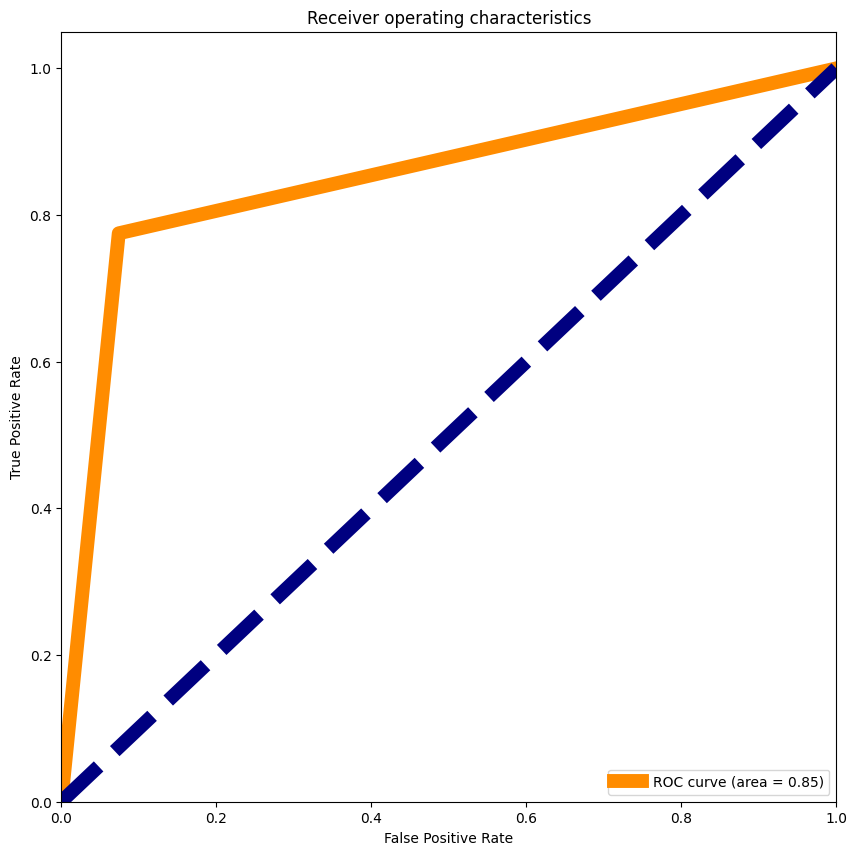

In [145]:
fpr,tpr,threshold=roc_curve(predknn,y_test)
roc_auc=auc(fpr,tpr)

plt.figure(figsize=(10,10))
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve (area = %0.2f)' %roc_auc)
plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristics')
plt.legend(loc="lower right")
plt.show()

### Here 85% of the area is under roc curve,which is better than rest
## ENSEMBLE TECHNIQUE

In [146]:
# Checking accuracy for Random Forest Classifier
rf = RandomForestClassifier()
rf.fit(x_train,y_train)

# Prediction
predrf = rf.predict(x_test)

print(accuracy_score(y_test, predrf))
print(confusion_matrix(y_test, predrf))
print(classification_report(y_test,predrf))
print('CV  :-',cross_val_score(rf,x,y,cv=5).mean())

0.8591201186356896
[[855 167]
 [118 883]]
              precision    recall  f1-score   support

           0       0.88      0.84      0.86      1022
           1       0.84      0.88      0.86      1001

    accuracy                           0.86      2023
   macro avg       0.86      0.86      0.86      2023
weighted avg       0.86      0.86      0.86      2023

CV  :- 0.7564884148807017


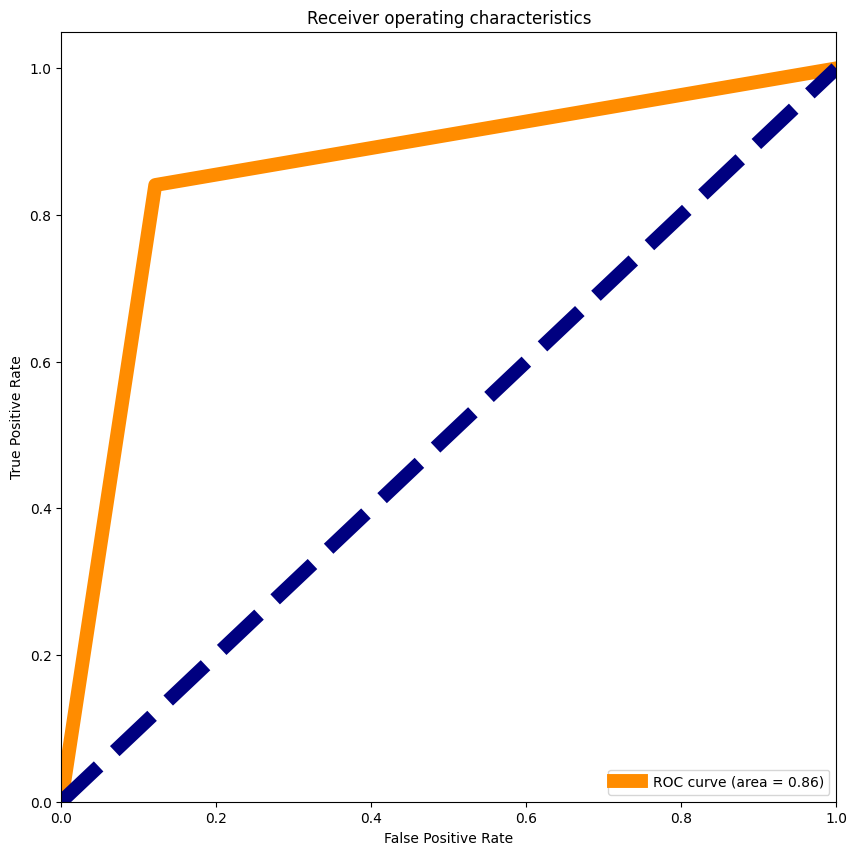

In [147]:
fpr,tpr,threshold=roc_curve(predrf,y_test)
roc_auc=auc(fpr,tpr)

plt.figure(figsize=(10,10))
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve (area = %0.2f)' %roc_auc)
plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristics')
plt.legend(loc="lower right")
plt.show()

## This model is best till now covering 87% of roc curve


In [148]:
# Checking accuracy for Gradient Boosting Classifier
gb = GradientBoostingClassifier()
gb.fit(x_train,y_train)

# Prediction
predgb = gb.predict(x_test)

print(accuracy_score(y_test, predgb))
print(confusion_matrix(y_test, predgb))
print(classification_report(y_test,predgb))

print('CV  :-',cross_val_score(gb,x,y,cv=5).mean())

0.7978250123578843
[[799 223]
 [186 815]]
              precision    recall  f1-score   support

           0       0.81      0.78      0.80      1022
           1       0.79      0.81      0.80      1001

    accuracy                           0.80      2023
   macro avg       0.80      0.80      0.80      2023
weighted avg       0.80      0.80      0.80      2023

CV  :- 0.697263223669639


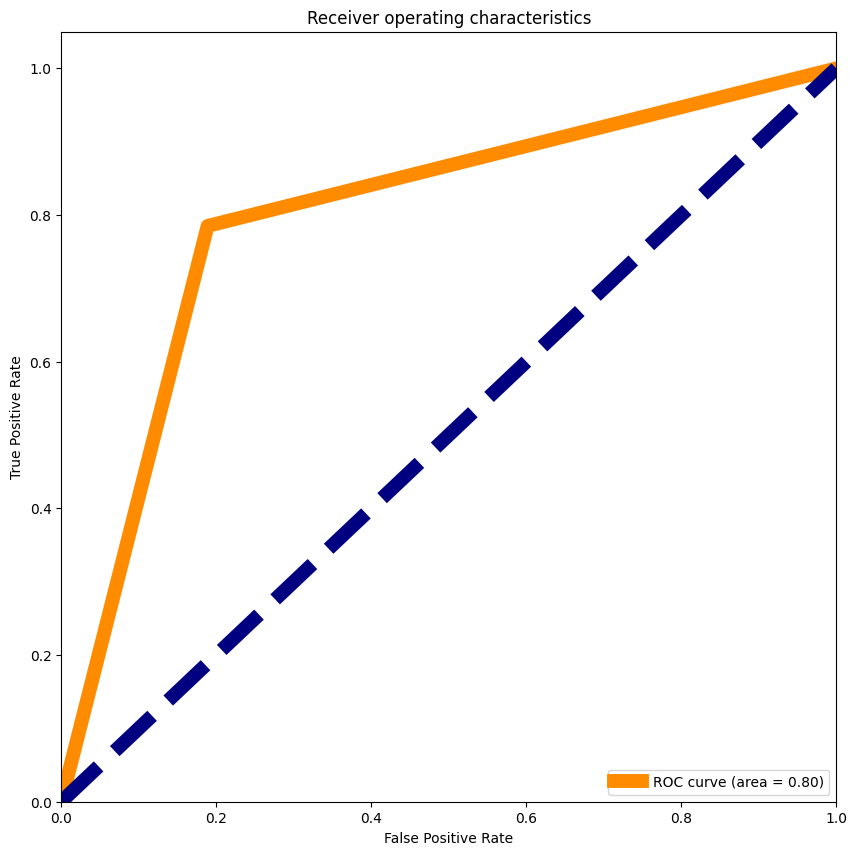

In [149]:
fpr,tpr,threshold=roc_curve(predgb,y_test)
roc_auc=auc(fpr,tpr)

plt.figure(figsize=(10,10))
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve (area = %0.2f)' %roc_auc)
plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristics')
plt.legend(loc="lower right")
plt.show()

## 80% area under roc curve

In [151]:
from sklearn.ensemble import ExtraTreesClassifier

# Checking accuracy for Gradient Boosting Classifier
et = ExtraTreesClassifier()
et.fit(x_train,y_train)

# Prediction
predet = et.predict(x_test)

print(accuracy_score(y_test, predet))
print(confusion_matrix(y_test, predet))
print(classification_report(y_test,predet))

print('CV  :-',cross_val_score(et,x,y,cv=5).mean())

0.8872960949085517
[[881 141]
 [ 87 914]]
              precision    recall  f1-score   support

           0       0.91      0.86      0.89      1022
           1       0.87      0.91      0.89      1001

    accuracy                           0.89      2023
   macro avg       0.89      0.89      0.89      2023
weighted avg       0.89      0.89      0.89      2023

CV  :- 0.7830839509830814


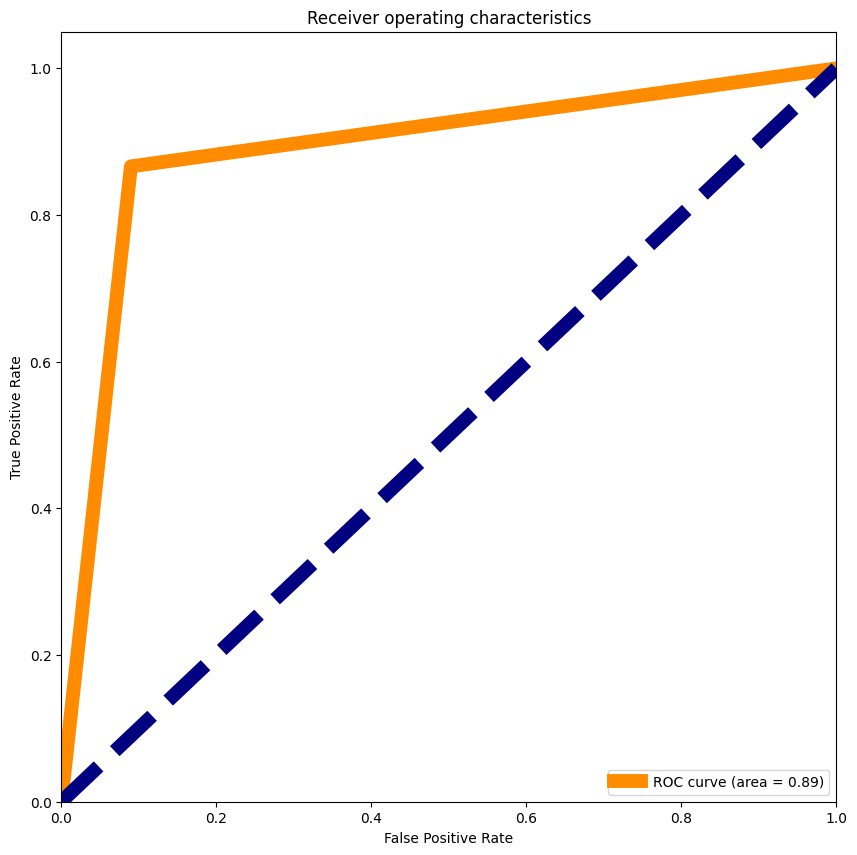

In [152]:
fpr,tpr,threshold=roc_curve(predet,y_test)
roc_auc=auc(fpr,tpr)

plt.figure(figsize=(10,10))
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve (area = %0.2f)' %roc_auc)
plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristics')
plt.legend(loc="lower right")
plt.show()

### This is the best model till now
### Plotting ROC and compare AUC for all the models used

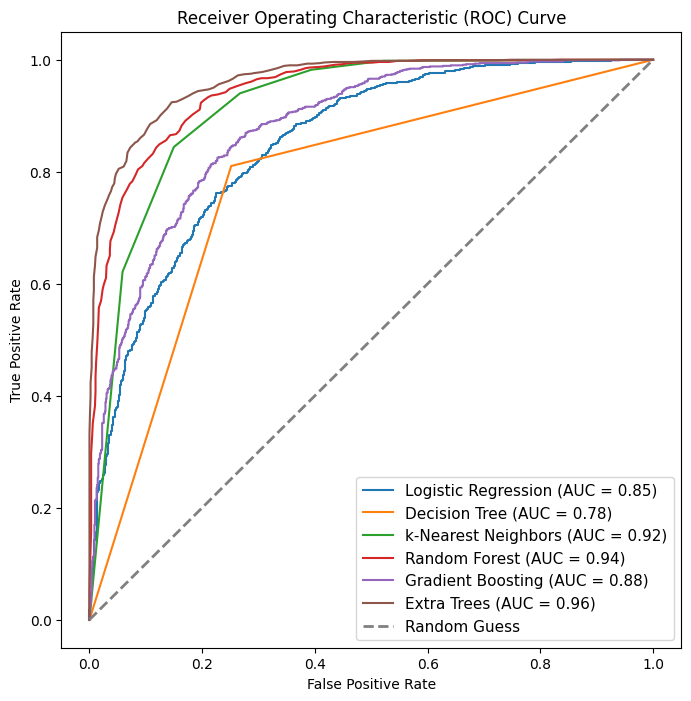

In [160]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Assuming lr, dt, knn, rf, gb, and et are your trained models

# Plotting for all the models used here
plt.figure(figsize=(8, 8))

# Logistic Regression
fpr_lr, tpr_lr, _ = roc_curve(y_test, lr.predict_proba(x_test)[:, 1])
roc_auc_lr = auc(fpr_lr, tpr_lr)
plt.plot(fpr_lr, tpr_lr, label='Logistic Regression (AUC = {:.2f})'.format(roc_auc_lr))

# Decision Tree
fpr_dt, tpr_dt, _ = roc_curve(y_test, dt.predict_proba(x_test)[:, 1])
roc_auc_dt = auc(fpr_dt, tpr_dt)
plt.plot(fpr_dt, tpr_dt, label='Decision Tree (AUC = {:.2f})'.format(roc_auc_dt))

# k-Nearest Neighbors
fpr_knn, tpr_knn, _ = roc_curve(y_test, knn.predict_proba(x_test)[:, 1])
roc_auc_knn = auc(fpr_knn, tpr_knn)
plt.plot(fpr_knn, tpr_knn, label='k-Nearest Neighbors (AUC = {:.2f})'.format(roc_auc_knn))

# Random Forest
fpr_rf, tpr_rf, _ = roc_curve(y_test, rf.predict_proba(x_test)[:, 1])
roc_auc_rf = auc(fpr_rf, tpr_rf)
plt.plot(fpr_rf, tpr_rf, label='Random Forest (AUC = {:.2f})'.format(roc_auc_rf))

# Gradient Boosting
fpr_gb, tpr_gb, _ = roc_curve(y_test, gb.predict_proba(x_test)[:, 1])
roc_auc_gb = auc(fpr_gb, tpr_gb)
plt.plot(fpr_gb, tpr_gb, label='Gradient Boosting (AUC = {:.2f})'.format(roc_auc_gb))

# Extra Trees
fpr_et, tpr_et, _ = roc_curve(y_test, et.predict_proba(x_test)[:, 1])
roc_auc_et = auc(fpr_et, tpr_et)
plt.plot(fpr_et, tpr_et, label='Extra Trees (AUC = {:.2f})'.format(roc_auc_et))

plt.plot([0, 1], [0, 1], linestyle='--', color='gray', linewidth=2, label='Random Guess')

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(prop={'size': 11}, loc='lower right')
plt.show()


## Making a dataframe of all the models accuracy score


In [161]:
mm=pd.DataFrame([["LR","77%"],["Decision Tree Classifier","79%"],["KNeighbors Classifier","83%"],["Random Forest Classifier","87%"],["Gradient Boosting","80%"],["Extra Tree Classifier","89%"]],
                    columns=["Model_Name","AccuracyScore"])

mm

,Model_Name,AccuracyScore
0,LR,77%
1,Decision Tree Classifier,79%
2,KNeighbors Classifier,83%
3,Random Forest Classifier,87%
4,Gradient Boosting,80%
5,Extra Tree Classifier,89%


## I will go for Extra Tree Classifier as it is the best performing model so far
# Hyperparameter Tuning

In [162]:
from sklearn.model_selection import GridSearchCV


In [163]:
et.get_params()


{'bootstrap': False,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'sqrt',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'monotonic_cst': None,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}

In [164]:
#Extra Tree Classifier
parameters = {'criterion' : ['gini','entropy'],
              'random_state' : [10, 50, 100],
              'max_depth' : [0, 10, 20],
              'n_jobs' : [-2, -1, 1,2,3,4],
              'n_estimators' : [50,100, 200, 300,400,500]}

In [165]:
qq=GridSearchCV(ExtraTreesClassifier(),parameters,cv=5)


In [166]:
qq.fit(x_train,y_train)


GridSearchCV(cv=5, estimator=ExtraTreesClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [0, 10, 20],
                         'n_estimators': [50, 100, 200, 300, 400, 500],
                         'n_jobs': [-2, -1, 1, 2, 3, 4],
                         'random_state': [10, 50, 100]})

In [167]:
qq.best_params_


{'criterion': 'gini',
 'max_depth': 20,
 'n_estimators': 500,
 'n_jobs': -2,
 'random_state': 100}

In [168]:
et = ExtraTreesClassifier(criterion ='gini',max_depth=20, n_estimators=400,n_jobs=-2,random_state=10)
et.fit(x_train, y_train)
pred = et.predict(x_test)
print('Accuracy_Score :-> ',accuracy_score(y_test,pred)*100)

Accuracy_Score :->  87.64211566979732


## Now Save the model


In [169]:
#Saving the model using .pkl
import joblib
joblib.dump(et,"RPR_study.pkl")

['RPR_study.pkl']

In [170]:
#Loading the saved model
aa=joblib.load("RPR_study.pkl")

In [171]:
#Prediction
prediction = aa.predict(x_test)
prediction

array([1, 1, 0, ..., 1, 1, 0])

In [172]:
pd.DataFrame([aa.predict(x_test)[:],y_test[:]],index=["Predicted","Original"])


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021

# CLassification side of the model is completed here and it is performing well


# Now Lets Build Regression model and here my target variable will be Rainfall

In [173]:
df_new


,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Year
0,1,13.4,22.9,0.804420,0.013789,0.017255,13,44.000000,13,14,0.840218,0.724508,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,0,0,1,2008
1,1,7.4,25.1,-0.646505,0.013789,0.017255,14,44.000000,6,15,-0.855037,0.537821,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,0,0,2,2008
2,1,12.9,25.7,-0.646505,0.013789,0.017255,15,46.000000,13,15,0.762898,0.906090,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,0,0,3,2008
3,1,9.2,28.0,-0.646505,0.013789,0.017255,4,24.000000,9,0,0.047334,-0.861238,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,0,0,4,2008
4,1,17.5,32.3,1.167595,0.013789,0.017255,13,41.000000,1,7,-0.414729,0.345422,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,0,0,5,2008
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,9,2.8,23.4,-0.646505,0.013789,0.017255,0,31.000000,9,1,0.246267,-0.616556,51.0,24.0,1024.6,1020.3,4.566622,4.503183,10.1,22.4,0,0,21,2017
8421,9,3.6,25.3,-0.646505,0.013789,0.017255,6,22.000000,9,3,0.246267,-0.861238,56.0,21.0,1023.5,1019.1,4.566622,4.503183,10.9,24.5,0,0,22,2017
8422,9,5.4,26.9,-0.646505,0.013789,0.017255,3,37.000000,9,14,-0.170863,-0.861238,53.0,24.0,1021.0,1016.8,4.566622,4.503183,12.5,26.1,0,0,23,2017
8423,9,7.8,27.0,-0.646505,0.013789,0.017255,9,28.000000,10,3,0.246267,-1.123601,51.0,24.0,1019.4,1016.5,3.000000,2.000000,15.1,26.0,0,0,24,2017


### Lets see the correlation of the column to the target variable


In [174]:
df_new.corr()['Rainfall'].sort_values()


Sunshine        -0.271467
Temp3pm         -0.261417
MaxTemp         -0.249897
Evaporation     -0.214748
Temp9am         -0.109432
Pressure9am     -0.108494
Pressure3pm     -0.030128
Day             -0.009898
WindSpeed3pm    -0.003899
WindSpeed9am     0.000439
Location         0.004384
Year             0.006934
WindGustSpeed    0.067871
MinTemp          0.068220
WindDir3pm       0.116175
WindGustDir      0.132982
WindDir9am       0.155435
Cloud3pm         0.273239
Cloud9am         0.311427
RainTomorrow     0.330985
Humidity3pm      0.403655
Humidity9am      0.425488
RainToday        0.931389
Rainfall         1.000000
Name: Rainfall, dtype: float64

## We can see that some columns are Negatively correlated and some are positively correlated ..Max positively correlated column is :- RainToday and Max Negetively column is :- Sunshine

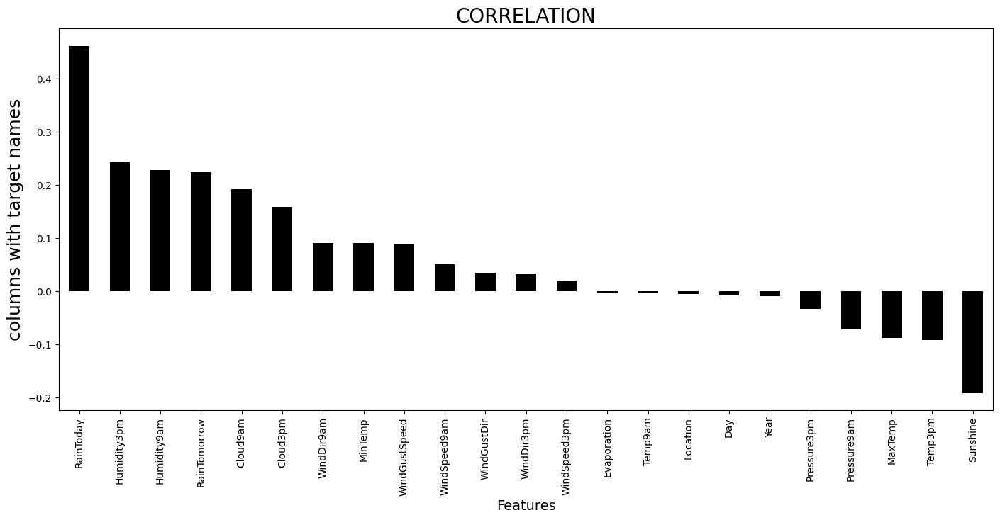

In [175]:
#checking the columns which are positively and negatively correlated

plt.figure(figsize=(17,7))
df.corr()['Rainfall'].sort_values(ascending=False).drop(['Rainfall']).plot(kind='bar',color='black')
plt.xlabel('Features',fontsize=14)
plt.ylabel('columns with target names',fontsize=18)
plt.title('CORRELATION',fontsize=20)
plt.show()

## We can see that the Temp9am is the least correlated to the taget variable


In [176]:
df_new


,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Year
0,1,13.4,22.9,0.804420,0.013789,0.017255,13,44.000000,13,14,0.840218,0.724508,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,0,0,1,2008
1,1,7.4,25.1,-0.646505,0.013789,0.017255,14,44.000000,6,15,-0.855037,0.537821,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,0,0,2,2008
2,1,12.9,25.7,-0.646505,0.013789,0.017255,15,46.000000,13,15,0.762898,0.906090,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,0,0,3,2008
3,1,9.2,28.0,-0.646505,0.013789,0.017255,4,24.000000,9,0,0.047334,-0.861238,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,0,0,4,2008
4,1,17.5,32.3,1.167595,0.013789,0.017255,13,41.000000,1,7,-0.414729,0.345422,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,0,0,5,2008
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,9,2.8,23.4,-0.646505,0.013789,0.017255,0,31.000000,9,1,0.246267,-0.616556,51.0,24.0,1024.6,1020.3,4.566622,4.503183,10.1,22.4,0,0,21,2017
8421,9,3.6,25.3,-0.646505,0.013789,0.017255,6,22.000000,9,3,0.246267,-0.861238,56.0,21.0,1023.5,1019.1,4.566622,4.503183,10.9,24.5,0,0,22,2017
8422,9,5.4,26.9,-0.646505,0.013789,0.017255,3,37.000000,9,14,-0.170863,-0.861238,53.0,24.0,1021.0,1016.8,4.566622,4.503183,12.5,26.1,0,0,23,2017
8423,9,7.8,27.0,-0.646505,0.013789,0.017255,9,28.000000,10,3,0.246267,-1.123601,51.0,24.0,1019.4,1016.5,3.000000,2.000000,15.1,26.0,0,0,24,2017


## Splitting input and target variable

In [177]:
x = df_new.drop("Rainfall", axis=1)
y = df_new["Rainfall"]

## WE CHECK MULTICOLLINEARITY BY VARIANCE INFLATION FACTOR (VIF)

In [178]:
def vif_cal():
    vif=pd.DataFrame()
    vif["VIF FACTOR"]=[variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
    vif["FEATURES"]=x.columns
    print (vif)

In [179]:
vif_cal()


       VIF FACTOR       FEATURES
0        4.570891       Location
1       57.349443        MinTemp
2      440.122863        MaxTemp
3        1.719706    Evaporation
4        2.126685       Sunshine
5        5.050637    WindGustDir
6       20.931507  WindGustSpeed
7        4.553995     WindDir9am
8        6.004272     WindDir3pm
9        2.013925   WindSpeed9am
10       1.903366   WindSpeed3pm
11      68.477121    Humidity9am
12      48.440819    Humidity3pm
13  614194.209536    Pressure9am
14  599217.907520    Pressure3pm
15       8.121147       Cloud9am
16       8.645582       Cloud3pm
17     188.566782        Temp9am
18     507.953290        Temp3pm
19       1.798421      RainToday
20       1.894585   RainTomorrow
21       4.207506            Day
22   48039.853775           Year


In [180]:
x.drop("Pressure9am",axis=1,inplace=True)


In [181]:
def vif_cal():
    vif=pd.DataFrame()
    vif["VIF FACTOR"]=[variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
    vif["FEATURES"]=x.columns
    print (vif)

In [182]:
vif_cal()


      VIF FACTOR       FEATURES
0       4.549131       Location
1      56.426858        MinTemp
2     440.115517        MaxTemp
3       1.703297    Evaporation
4       2.118426       Sunshine
5       5.009939    WindGustDir
6      20.738185  WindGustSpeed
7       4.480457     WindDir9am
8       5.715997     WindDir3pm
9       2.006594   WindSpeed9am
10      1.900163   WindSpeed3pm
11     68.198883    Humidity9am
12     48.046538    Humidity3pm
13  44898.194591    Pressure3pm
14      8.118922       Cloud9am
15      8.638260       Cloud3pm
16    187.173734        Temp9am
17    496.939269        Temp3pm
18      1.778032      RainToday
19      1.888097   RainTomorrow
20      4.204215            Day
21  46479.832475           Year


In [183]:
x.drop("Year",axis=1,inplace=True)


In [184]:
def vif_cal():
    vif=pd.DataFrame()
    vif["VIF FACTOR"]=[variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
    vif["FEATURES"]=x.columns
    print (vif)

In [185]:
vif_cal()


    VIF FACTOR       FEATURES
0     4.542931       Location
1    56.426136        MinTemp
2   438.831565        MaxTemp
3     1.687941    Evaporation
4     2.118426       Sunshine
5     4.989865    WindGustDir
6    19.455561  WindGustSpeed
7     4.480452     WindDir9am
8     5.684836     WindDir3pm
9     1.999534   WindSpeed9am
10    1.894220   WindSpeed3pm
11   68.014794    Humidity9am
12   48.045179    Humidity3pm
13  149.512561    Pressure3pm
14    8.114428       Cloud9am
15    8.633020       Cloud3pm
16  186.181497        Temp9am
17  496.938872        Temp3pm
18    1.776957      RainToday
19    1.876212   RainTomorrow
20    4.203366            Day


In [186]:
x.drop("Temp3pm",axis=1,inplace=True)


In [187]:
def vif_cal():
    vif=pd.DataFrame()
    vif["VIF FACTOR"]=[variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
    vif["FEATURES"]=x.columns
    print (vif)

In [188]:
vif_cal()


    VIF FACTOR       FEATURES
0     4.541244       Location
1    56.044232        MinTemp
2   154.688996        MaxTemp
3     1.687899    Evaporation
4     2.116596       Sunshine
5     4.967881    WindGustDir
6    19.269976  WindGustSpeed
7     4.467507     WindDir9am
8     5.669189     WindDir3pm
9     1.999169   WindSpeed9am
10    1.889083   WindSpeed3pm
11   60.733216    Humidity9am
12   33.839373    Humidity3pm
13  138.940538    Pressure3pm
14    8.109266       Cloud9am
15    8.589691       Cloud3pm
16  175.231219        Temp9am
17    1.774098      RainToday
18    1.875960   RainTomorrow
19    4.202908            Day


### This is the last column i am going to delete bcz we cannot drop all columns like that


In [189]:
x.drop("Temp9am",axis=1,inplace=True)


In [190]:
def vif_cal():
    vif=pd.DataFrame()
    vif["VIF FACTOR"]=[variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
    vif["FEATURES"]=x.columns
    print (vif)

In [191]:
vif_cal()


    VIF FACTOR       FEATURES
0     4.518633       Location
1    30.004221        MinTemp
2    90.076788        MaxTemp
3     1.682382    Evaporation
4     2.105155       Sunshine
5     4.964003    WindGustDir
6    19.001091  WindGustSpeed
7     4.463029     WindDir9am
8     5.669112     WindDir3pm
9     1.976400   WindSpeed9am
10    1.842494   WindSpeed3pm
11   42.325080    Humidity9am
12   26.824721    Humidity3pm
13  133.314913    Pressure3pm
14    8.034031       Cloud9am
15    8.577824       Cloud3pm
16    1.768469      RainToday
17    1.875761   RainTomorrow
18    4.202608            Day


## Multicollinearity is reduced but not eliminated
## Building Regression model

In [192]:
from sklearn.linear_model import LinearRegression
lr=LinearRegression()
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split

In [193]:
for i in range(0,100):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=i)
    lr.fit(x_train,y_train)
    pred_train=lr.predict(x_train)
    pred_test=lr.predict(x_test)
    print (f"At random state {i},the training accuracy is :- {r2_score(y_train,pred_train)}")
    print (f"At random state {i},the testing accuracy is :- {r2_score(y_test,pred_test)}")
    print ("\n\n")

At random state 0,the training accuracy is :- 0.8800268428039282
At random state 0,the testing accuracy is :- 0.8772372562320876



At random state 1,the training accuracy is :- 0.8802950771447948
At random state 1,the testing accuracy is :- 0.8766241855395888



At random state 2,the training accuracy is :- 0.881071942563654
At random state 2,the testing accuracy is :- 0.8730922849736009



At random state 3,the training accuracy is :- 0.8832232459857546
At random state 3,the testing accuracy is :- 0.8648374770298898



At random state 4,the training accuracy is :- 0.8783940225331252
At random state 4,the testing accuracy is :- 0.8841083161552149



At random state 5,the training accuracy is :- 0.8775314424754981
At random state 5,the testing accuracy is :- 0.8877036616264187



At random state 6,the training accuracy is :- 0.8793757062439204
At random state 6,the testing accuracy is :- 0.8802909964010835



At random state 7,the training accuracy is :- 0.878885902010194
At random sta

In [194]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=11)


In [195]:
# train the model
lr.fit(x_train,y_train)

LinearRegression()

In [196]:
# predict the  data with x_test

pred_test=lr.predict(x_test)

In [197]:
print (r2_score(y_test,pred_test))


0.877915104814286


# CROSS VALIDATION OF THE LINEAR REGRESSION MODEL


In [198]:
pred_lr=lr.predict(x_test)
from sklearn.model_selection import cross_val_score
lss=r2_score(y_test,pred_lr)

In [199]:
for i in range(4,10):
    lsscore=cross_val_score(lr,x,y,cv=i)
    lsc=lsscore.mean()
    print ("At cv:-",i)
    print ("Cross validation score is :-",lsc*100)
    print ("Accuracy_score is :-",lss*100)
    print ("\n")

At cv:- 4
Cross validation score is :- 87.69214085819208
Accuracy_score is :- 87.7915104814286


At cv:- 5
Cross validation score is :- 87.6499550322954
Accuracy_score is :- 87.7915104814286


At cv:- 6
Cross validation score is :- 87.71360486869172
Accuracy_score is :- 87.7915104814286


At cv:- 7
Cross validation score is :- 87.69302769826807
Accuracy_score is :- 87.7915104814286


At cv:- 8
Cross validation score is :- 87.59500467598991
Accuracy_score is :- 87.7915104814286


At cv:- 9
Cross validation score is :- 87.67122088966866
Accuracy_score is :- 87.7915104814286




In [200]:
# I will take CV as 5 bcz its close to accuracy score
lsscore_selected= cross_val_score(lr,x,y,cv=9).mean()
print ("The cv score is :- ",lsscore_selected,"\nThe accuracy_score is:",lss)

The cv score is :-  0.8767122088966866 
The accuracy_score is: 0.877915104814286


In [201]:
from sklearn import metrics


In [202]:
MAE= metrics.mean_absolute_error(y_test,pred_test)
MSE= metrics.mean_squared_error(y_test,pred_test)

In [203]:
print("mean absolute error:",MAE)
print("mean squared error:",MSE)

mean absolute error: 0.2239058958036717
mean squared error: 0.12107048766218213


In [204]:
from math import sqrt
rmse = sqrt(MSE)
print("Root Mean Squared Error:",rmse)

Root Mean Squared Error: 0.3479518467578267


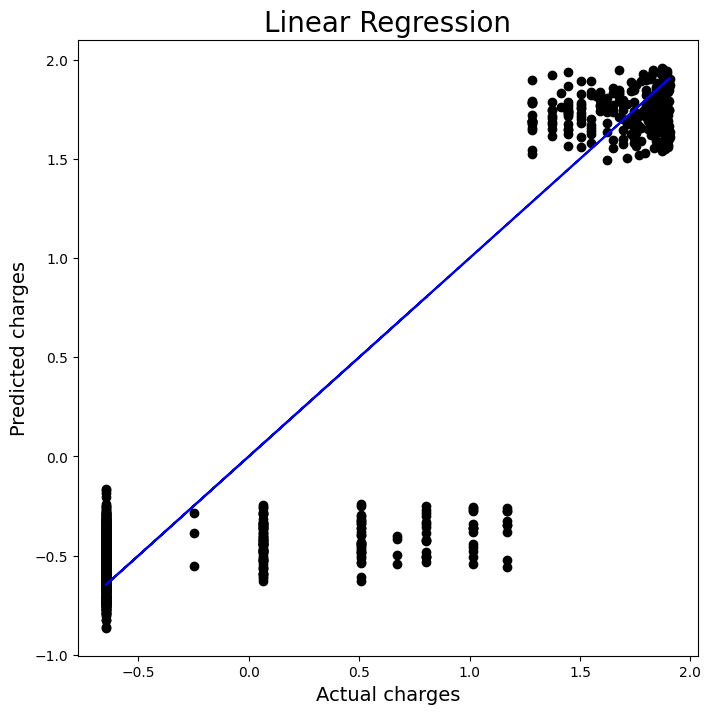

In [205]:
import matplotlib.pyplot as plt
plt.figure(figsize=(8,8))
plt.scatter (x=y_test,y=pred_test,color='black')

plt.plot(y_test,y_test,color='b')

plt.xlabel('Actual charges' ,fontsize=14)

plt.ylabel('Predicted charges', fontsize=14)
plt.title('Linear Regression' , fontsize=20)
plt. show()

## Some of the data are falling Outside the best fit line


In [206]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor as KNN
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor

In [207]:
kn=KNeighborsRegressor()
kn.fit(x_train,y_train)

predkn=kn.predict(x_test)
print('R2_Score:',r2_score(y_test,predkn))
print('MAE:',metrics.mean_absolute_error(y_test, predkn))
print('MSE:',metrics.mean_squared_error(y_test, predkn))
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test, predkn)))
print('cv :-' ,cross_val_score(kn,x,y,cv=5).mean())

R2_Score: 0.26662262248540625
MAE: 0.5798586758181441
MSE: 0.727283720078863
RMSE: 0.8528093105019803
cv :- 0.19668577239635857


In [208]:
dt=DecisionTreeRegressor()
dt.fit(x_train,y_train)

preddt=dt.predict(x_test)
print('R2_Score:',r2_score(y_test,preddt))
print('MAE:',metrics.mean_absolute_error(y_test, preddt))
print('MSE:',metrics.mean_squared_error(y_test, preddt))
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test, preddt)))
print('cv :-' ,cross_val_score(dt,x,y,cv=5).mean())

R2_Score: 0.7297542419800981
MAE: 0.2511520619190422
MSE: 0.2680002768756463
RMSE: 0.5176874316377077
cv :- 0.7150984396060459


In [209]:
RF=RandomForestRegressor()
RF.fit(x_train,y_train)

predRF=RF.predict(x_test)
print('R2_Score:',r2_score(y_test,predRF))
print('MAE:',metrics.mean_absolute_error(y_test, predRF))
print('MSE:',metrics.mean_squared_error(y_test, predRF))
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test, predRF)))
print('cv :-' ,cross_val_score(RF,x,y,cv=5).mean())

R2_Score: 0.8762950755715548
MAE: 0.2147715015940394
MSE: 0.12267705602713914
RMSE: 0.3502528458515921
cv :- 0.8665485924041463


In [210]:
gb=GradientBoostingRegressor()
gb.fit(x_train,y_train)

# prediction
predgb=gb.predict(x_test)
print('R2_Score:',r2_score(y_test,predgb))
print('MAE:',metrics.mean_absolute_error(y_test, predgb))
print('MSE:',metrics.mean_squared_error(y_test, predgb))
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test, predgb)))
print('cv :-' ,cross_val_score(gb,x,y,cv=5).mean())

R2_Score: 0.8802437670338534
MAE: 0.20929911177867233
MSE: 0.11876117437576243
RMSE: 0.34461743190930205
cv :- 0.8764337468953182


In [211]:
ad=AdaBoostRegressor()
ad.fit(x_train,y_train)

# prediction
predad=ad.predict(x_test)
print('R2_Score:',r2_score(y_test,predad))
print('MAE:',metrics.mean_absolute_error(y_test, predad))
print('MSE:',metrics.mean_squared_error(y_test, predad))
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test, predad)))
print('cv :-' ,cross_val_score(ad,x,y,cv=5).mean())

R2_Score: 0.8327395472340602
MAE: 0.3369796797712076
MSE: 0.16587068000644317
RMSE: 0.4072722431082717
cv :- 0.8522305617677646


In [212]:
# Hyper parameter tuning


In [213]:
gb.get_params()


{'alpha': 0.9,
 'ccp_alpha': 0.0,
 'criterion': 'friedman_mse',
 'init': None,
 'learning_rate': 0.1,
 'loss': 'squared_error',
 'max_depth': 3,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_iter_no_change': None,
 'random_state': None,
 'subsample': 1.0,
 'tol': 0.0001,
 'validation_fraction': 0.1,
 'verbose': 0,
 'warm_start': False}

In [214]:
#RandomForestRegressor
parameters = {'criterion':['friedman_mse', 'squared_error'],
             'max_features':['auto', 'sqrt', 'log2'],
             'loss':['squared_error','absolute_error','huber','quantile'],
             'warm_start':[True,False]}

In [215]:
gg=GridSearchCV(GradientBoostingRegressor(),parameters,cv=5)


In [216]:
gg.fit(x_train,y_train)


GridSearchCV(cv=5, estimator=GradientBoostingRegressor(),
             param_grid={'criterion': ['friedman_mse', 'squared_error'],
                         'loss': ['squared_error', 'absolute_error', 'huber',
                                  'quantile'],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'warm_start': [True, False]})

In [217]:
gg.best_params_


{'criterion': 'squared_error',
 'loss': 'squared_error',
 'max_features': 'sqrt',
 'warm_start': True}

In [222]:
gb = GradientBoostingRegressor(criterion='friedman_mse', loss='squared_error', max_features=None, warm_start=True)
gb.fit(x_train, y_train)
pred = gb.predict(x_test)
print('R2 Score:', r2_score(y_test, pred) * 100)


R2 Score: 87.9893531635847


# Now Save the model


In [223]:
#Saving the model using .pkl
import joblib
joblib.dump(gb,"RPRR_study.pkl")

['RPRR_study.pkl']

In [224]:
#Loading the saved model
aa=joblib.load("RPRR_study.pkl")

In [225]:
Prediction
prediction = aa.predict(x_test)
prediction

NameError: name 'Prediction' is not defined

In [ ]:
pd.DataFrame([aa.predict(x_test)[:],y_test[:]],index=["Predicted","Original"])


# Regression side of the model is also completed Now